## Import Packages

In [1]:
import warnings
warnings.filterwarnings("ignore") # suppress warnings

In [2]:
import os
import torch
import numpy as np
import pandas as pd
import torch.nn as nn
import seaborn as sns
import geopandas as gpd
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset, random_split

plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

### Load the Data

In [3]:
# all_cols = ["date", "shot_number", "BEAM_l2a", "Latitude_l2a", "Longitude_l2a", 
#             "quality_flag", "num_detectedmodes", "rh_90", "rh_95", "rh_98", "rh_99", 
#             "rh_100", "sensitivity", "solar_elevation", "geometry_l2a", "Easting_l2a", 
#             "Northing_l2a", "elevation_NAVD88_gedi_from_crs_l2a", "GEDI02_A_slope_ratio_utm", 
#             "GEDI02_A_slope_degrees_utm", "GEDI02_A_slope_rise_run", "rx_sample_count", "cover_z_10", 
#             "cover_z_15", "cover_z_20", "cover_z_25", "cover_z_27", "cover_z_28", "cover_z_29", 
#             "fhd_normal", "pai_z_10", "pai_z_15", "pai_z_20", "pai_z_25", "pai_z_27", "pai_z_28", 
#             "pai_z_29", "pavd_z_10", "pavd_z_15", "pavd_z_20", "pavd_z_25", "pavd_z_27", "pavd_z_28", "pavd_z_29", "rh100"]

drop_cols = ["date", "BEAM_l2a", "shot_number", "Latitude_l2a", "Longitude_l2a", 
             "rh_85", "rh_90", "rh_95", "rh_98", "rh_99", "rh_100", "GEDI02_A_slope_ratio_utm", 
             "GEDI02_A_slope_rise_run", "cover_z_10", "cover_z_15", "cover_z_20", 
             "cover_z_25", "cover_z_27", "cover_z_28", "pai_z_10", "pai_z_15", 
             "pai_z_20", "pai_z_25", "pai_z_27", "pai_z_28", "pavd_z_10", 
             "pavd_z_15", "pavd_z_20", "pavd_z_25", "pavd_z_27", "pavd_z_28", "rh100", "geometry"]

# drop = ["elevation_NAVD88_gedi_from_pipe_l2a", "elevation_l2a", "degrade_flag", "quality_flag", "rhog", "rhov"]

In [4]:
target_col = "rh_80"
gedi_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/"
gedi_file = "gedi_ml2.geojson"
pd.set_option("display.max_columns", None)
gedi_data = gpd.read_file(os.path.join(gedi_dir, gedi_file))
gedi_data = gedi_data.drop(drop_cols, axis = 1)
gedi_data = gedi_data[gedi_data["fhd_normal"] != -9999.000000]
gedi_data["GEDI02_A_slope_degrees_utm"] = gedi_data["GEDI02_A_slope_degrees_utm"].abs() # make everything in the column positive
gedi_data = gedi_data[gedi_data[target_col] <= 15]
gedi_data.head()

ERROR 1: PROJ: proj_create_from_database: Open of /bsuscratch/tnde/miniforge3/envs/veg_height/share/proj failed


,quality_flag,num_detectedmodes,rh_80,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
0,1,1,1.08,0.976120,1.137563,513688.964915,4.795170e+06,1815.427281,0.996506,755.0,0.0,1.417535,-0.0,-0.0
1,1,1,0.97,0.975038,1.137287,513736.570004,4.795201e+06,1815.428389,0.001113,749.0,0.0,1.340707,-0.0,-0.0
2,1,1,1.12,0.976903,1.137010,513784.205063,4.795233e+06,1814.398598,1.034706,766.0,0.0,1.658798,-0.0,-0.0
3,1,1,0.93,0.971373,1.136734,513831.832065,4.795264e+06,1813.271707,1.132363,745.0,0.0,1.269725,-0.0,-0.0
4,1,1,0.89,0.973743,1.136458,513879.447137,4.795295e+06,1813.272818,0.001117,745.0,0.0,0.790818,-0.0,-0.0


In [5]:
gedi_data.shape

(12792, 14)

In [6]:
gedi_data = gedi_data.dropna()
gedi_data.shape

(12792, 14)

In [7]:
# display(gedi_data["fhd_normal"])#.unique())
# display(gedi_data[gedi_data["fhd_normal"]==-9999.000000].head())
# display(gedi_data[["rh_100", "rh100"]])
display(gedi_data["quality_flag"].unique())
display(gedi_data["num_detectedmodes"].unique())

array([1, 0], dtype=int32)

array([1, 2, 3, 4, 5], dtype=int32)

In [8]:
# gedi_data
# np.unique(X_train_0[:, 0])

### Train-Test Split

In [9]:
# # Reshuffle data
# gedi_data = shuffle(gedi_data, random_state=0)

# # Predictor variables
# x = gedi_data.drop(target_col, axis = 1).values
# # Target variable
# y = gedi_data[target_col].values

# # Split the data into train and test sets (80% train, 20% test). We shuffle for the second time.
# X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(x, y, test_size=0.2, shuffle=True, random_state=42)

# # Keep copies of the test data for future use
# X_test_copy = X_test_0
# y_test_copy = y_test_0

# # Standardize the features (x)
# scaler_X = StandardScaler()
# X_train_scaled = scaler_X.fit_transform(X_train_0)
# X_test_scaled = scaler_X.transform(X_test_0)

# # Standardize the target variable (y) if needed
# scaler_y = StandardScaler()
# y_train_scaled = scaler_y.fit_transform(y_train_0.reshape(-1, 1))  # Reshape for 2D array
# y_test_scaled = scaler_y.transform(y_test_0.reshape(-1, 1))  # Reshape for 2D array

# # Convert the standardized data to PyTorch tensors
# X_train_tensor_0 = torch.from_numpy(X_train_scaled).float()
# y_train_tensor_0 = torch.from_numpy(y_train_scaled).float()

# X_test_tensor = torch.from_numpy(X_test_scaled).float()
# y_test_tensor = torch.from_numpy(y_test_scaled).float()

# # Check the shapes of the tensors
# print(f"X_train shape: {X_train_tensor_0.shape}")
# print(f"y_train shape: {y_train_tensor_0.shape}")
# print(f"X_test shape: {X_test_tensor.shape}")
# print(f"y_test shape: {y_test_tensor.shape}")

In [10]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

# The first column is categorical
categorical_features = [0]  # index of the categorical column
numerical_features = list(range(1, gedi_data.shape[1] - 1))  # assuming last column is the target

# Reshuffle data
gedi_data = shuffle(gedi_data, random_state=0)

# Separate features and target
X = gedi_data.drop(target_col, axis = 1) # Predictor variables
y = gedi_data[target_col].values # Target variable

# Build a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
        ("num", StandardScaler(), numerical_features),
    ]
)

# Split data
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)
# Keep copies of the test data for future use
X_test_copy = X_test_0.values
y_test_copy = y_test_0

# Standardize the features (X)
X_train_scaled = preprocessor.fit_transform(X_train_0)
X_test_scaled = preprocessor.transform(X_test_0)

# Standardize the target if needed
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train_0.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test_0.reshape(-1, 1))

# Convert the standardized data to PyTorch tensors
X_train_tensor_0 = torch.from_numpy(X_train_scaled.toarray() if hasattr(X_train_scaled, "toarray") else X_train_scaled).float()
X_test_tensor = torch.from_numpy(X_test_scaled.toarray() if hasattr(X_test_scaled, "toarray") else X_test_scaled).float()

y_train_tensor_0 = torch.from_numpy(y_train_scaled).float()
y_test_tensor = torch.from_numpy(y_test_scaled).float()

# Check the shapes of the tensors
print(f"X_train shape: {X_train_tensor_0.shape}")
print(f"y_train shape: {y_train_tensor_0.shape}")
print(f"X_test shape: {X_test_tensor.shape}")
print(f"y_test shape: {y_test_tensor.shape}")

X_train shape: torch.Size([10233, 14])
y_train shape: torch.Size([10233, 1])
X_test shape: torch.Size([2559, 14])
y_test shape: torch.Size([2559, 1])


In [11]:
# preprocessor.named_transformers_["cat"].get_feature_names_out()

### Exploratory Data Analysis (EDA)

<!-- #### Data Visualization and Descriptive Statistics -->

Data visualization and description are necessary to give us first-hand information about the features in the data set, such as the distribution of the features as well as the relationship between the features. We do so on the training data. 

In [12]:
gedi_cols = gedi_data.drop([target_col], axis = 1).columns
print(gedi_cols)
eda_data = pd.DataFrame(X_train_0, columns = gedi_cols)
# eda_data = eda_data.drop(["Easting_l2a", "Northing_l2a", "quality_flag", "elevation_NAVD88_gedi_from_crs_l2a", 
#                           "GEDI02_A_slope_degrees_utm", "rx_sample_count", "solar_elevation", "fhd_normal"], axis = 1)
eda_data = eda_data.drop(["quality_flag"], axis = 1)
print("\n", eda_data.columns)
eda_data.head()

Index(['quality_flag', 'num_detectedmodes', 'sensitivity', 'solar_elevation',
       'Easting_l2a', 'Northing_l2a', 'elevation_NAVD88_gedi_from_crs_l2a',
       'GEDI02_A_slope_degrees_utm', 'rx_sample_count', 'cover_z_29',
       'fhd_normal', 'pai_z_29', 'pavd_z_29'],
      dtype='object')

 Index(['num_detectedmodes', 'sensitivity', 'solar_elevation', 'Easting_l2a',
       'Northing_l2a', 'elevation_NAVD88_gedi_from_crs_l2a',
       'GEDI02_A_slope_degrees_utm', 'rx_sample_count', 'cover_z_29',
       'fhd_normal', 'pai_z_29', 'pavd_z_29'],
      dtype='object')


,num_detectedmodes,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
8503,1,0.948920,-6.587242,512744.685972,4.786947e+06,1646.809806,23.352595,771.0,0.0,1.629862,-0.0,-0.0
3013,1,0.962545,-25.186886,514598.712835,4.785294e+06,1434.010185,12.335975,791.0,0.0,1.876577,-0.0,-0.0
5602,1,0.961711,-19.834354,515989.040387,4.783514e+06,1513.613636,13.763201,808.0,0.0,2.135448,-0.0,-0.0
6778,1,0.961215,-16.716526,516926.577575,4.792621e+06,1390.418352,3.811440,750.0,0.0,1.324465,-0.0,-0.0
5239,1,0.953298,-19.777500,521989.209440,4.789082e+06,1226.928712,1.521219,764.0,0.0,1.343899,-0.0,-0.0


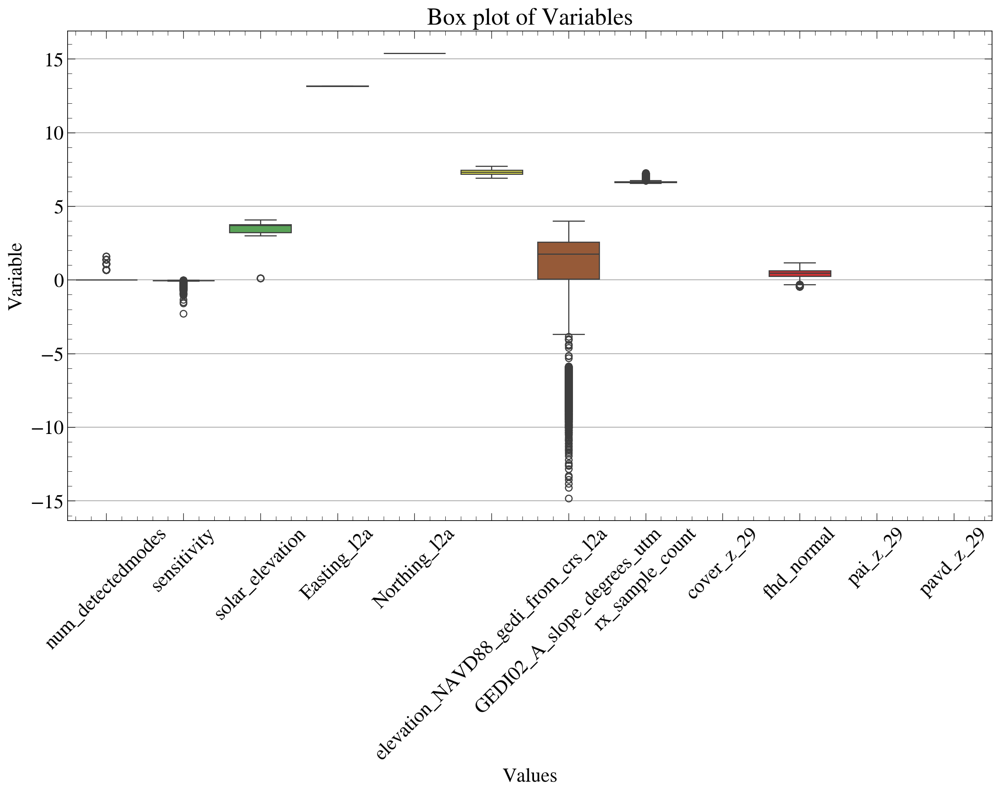

In [13]:
plt.figure(figsize = (15,8))
# sns.boxplot(data = eda_data, palette="Set1")
sns.boxplot(data = np.log(eda_data), palette="Set1")
plt.xlabel("Values")
plt.ylabel("Variable")
plt.xticks(rotation = 45)
plt.title("Box plot of Variables")
plt.show()

In [14]:
eda_data.describe()

,num_detectedmodes,sensitivity,solar_elevation,Easting_l2a,Northing_l2a,elevation_NAVD88_gedi_from_crs_l2a,GEDI02_A_slope_degrees_utm,rx_sample_count,cover_z_29,fhd_normal,pai_z_29,pavd_z_29
count,10233.000000,10233.000000,10233.000000,10233.000000,1.023300e+04,10233.000000,1.023300e+04,10233.000000,10233.0,10233.000000,10233.0,10233.0
mean,1.063813,0.948291,8.146024,518267.814501,4.782544e+06,1531.912252,8.235340e+00,788.694518,0.0,1.579302,0.0,0.0
std,0.315319,0.050631,29.089527,3632.098002,6.869611e+03,254.690458,8.440734e+00,61.357741,0.0,0.493010,0.0,0.0
min,1.000000,0.101439,-39.033321,511435.153978,4.767648e+06,1005.236054,3.634544e-07,710.000000,0.0,0.000000,-0.0,-0.0
25%,1.000000,0.949474,-19.821489,515158.510469,4.776493e+06,1307.814391,1.052798e+00,759.000000,0.0,1.292886,0.0,0.0
50%,1.000000,0.957936,-2.434116,518272.004415,4.783742e+06,1514.351711,5.800926e+00,774.000000,0.0,1.580574,0.0,0.0
75%,1.000000,0.964506,40.380344,521325.573662,4.788348e+06,1730.064276,1.293586e+01,799.000000,0.0,1.892379,0.0,0.0
max,5.000000,0.991439,59.157703,525279.148863,4.795483e+06,2233.326333,5.399624e+01,1415.000000,0.0,3.263339,-0.0,-0.0


In [15]:
# gedi_data#[gedi_data["num_detectedmodes"] > 1]

In [16]:
np.min(gedi_data["num_detectedmodes"])

1

In [17]:
gedi_data[["num_detectedmodes", target_col]].describe()

,num_detectedmodes,rh_80
count,12792.000000,12792.000000
mean,1.063477,2.138407
std,0.312667,1.783053
min,1.000000,0.440000
25%,1.000000,1.212500
50%,1.000000,1.610000
75%,1.000000,2.310000
max,5.000000,14.920000


### Pair Plot

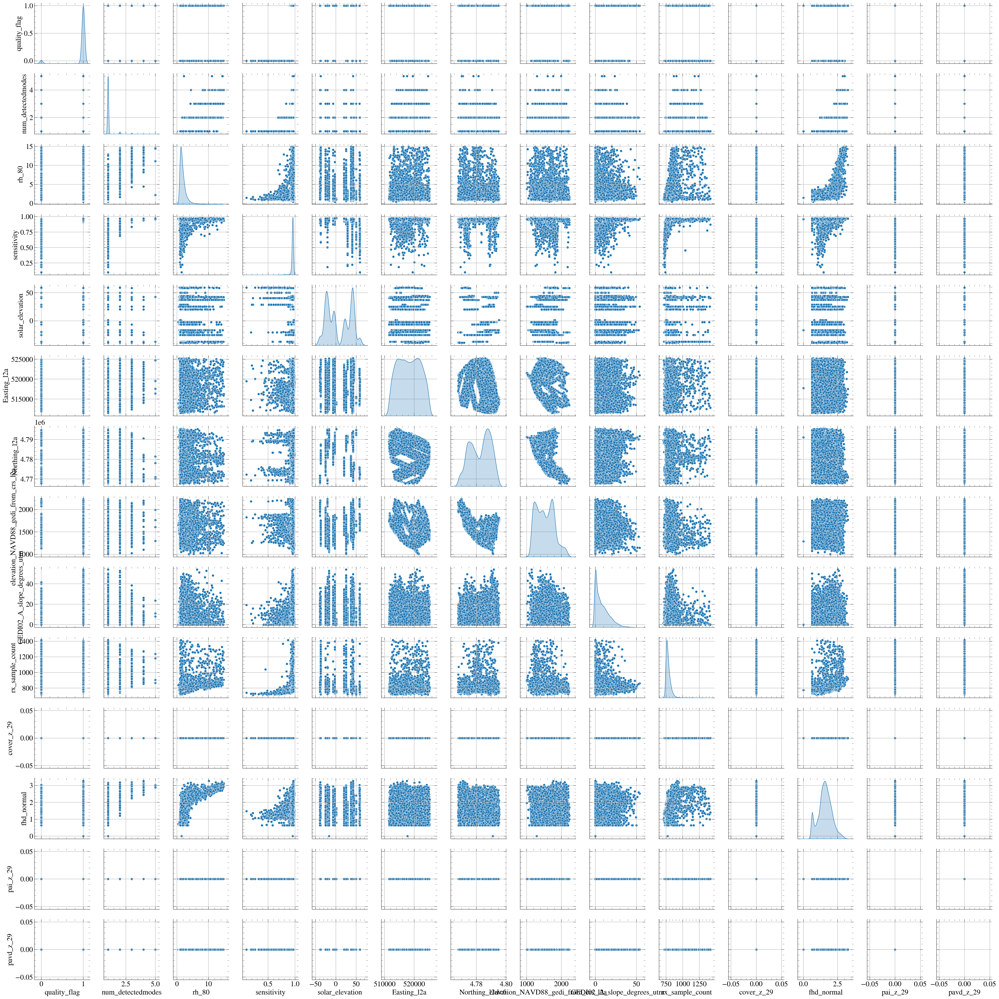

In [18]:
# sns.pairplot(eda_data, diag_kind='kde')
sns.pairplot(gedi_data, diag_kind='kde')
# sns.pairplot(np.log(gedi_data), diag_kind='kde')
plt.tick_params(axis="both", direction="in", length=8, which = "both", 
                labelsize=12, top = True, right = True, rotation = 45)
plt.xlabel(" ", fontsize=20)
plt.xticks(rotation = 90)
plt.show()

## Monte Carlo Dropout 

The code in this notebook is a step‐by‐step PyTorch demonstration of how to implement Monte Carlo (MC) dropout as an ensemble method.

###  Define Model Architecture: a Neural Network with Dropout
We include dropout layers that will be active during both training and MC inference. During training, **dropout** is a **regularization technique**. During inference, dropout is an ensemble technique.

In [19]:
class MCDropoutNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, dropout_rate=0.5):
        super(MCDropoutNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)  # Dropout layer
        x = F.relu(self.fc2(x))
        x = self.dropout(x)  # Dropout layer
        output = self.fc3(x)
        return output

# ############################################################
# class MCDropoutNet(nn.Module):
#     def __init__(self, input_dim, hidden_dim, output_dim, dropout_rate=0.5):
#         super(MCDropoutNet, self).__init__()
        
#         # Define the layers with Batch Normalization and LeakyReLU activation
#         self.fc1 = nn.Linear(input_dim, hidden_dim)
#         self.bn1 = nn.BatchNorm1d(hidden_dim)
#         self.dropout1 = nn.Dropout(dropout_rate)
        
#         self.fc2 = nn.Linear(hidden_dim, hidden_dim)
#         self.bn2 = nn.BatchNorm1d(hidden_dim)
#         self.dropout2 = nn.Dropout(dropout_rate)
        
#         self.fc3 = nn.Linear(hidden_dim, hidden_dim)
#         self.bn3 = nn.BatchNorm1d(hidden_dim)
#         self.dropout3 = nn.Dropout(dropout_rate)
        
#         self.fc4 = nn.Linear(hidden_dim, output_dim)
        
#     def forward(self, x):
#         # First layer: Linear -> BatchNorm -> LeakyReLU -> Dropout
#         x = self.fc1(x)
#         x = self.bn1(x)
#         x = F.leaky_relu(x, negative_slope=0.01)  # Leaky ReLU activation
#         # x = F.relu(x)  # Use ReLU activation
#         x = self.dropout1(x)
        
#         # Second layer: Linear -> BatchNorm -> LeakyReLU -> Dropout
#         x = self.fc2(x)
#         x = self.bn2(x)
#         x = F.leaky_relu(x, negative_slope=0.01)
#         # x = F.relu(x)  # Use ReLU activation
#         x = self.dropout2(x)
        
#         # Third layer: Linear -> BatchNorm -> LeakyReLU -> Dropout
#         x = self.fc3(x)
#         x = self.bn3(x)
#         x = F.leaky_relu(x, negative_slope=0.01)
#         # x = F.relu(x)  # Use ReLU activation
#         x = self.dropout3(x)
        
#         # Output layer: Linear -> No activation (for regression)
#         output = self.fc4(x)
        
#         return output

### Train the Model

#### With No Batch Size and Validation Set

Here, we will train the model using mean squared error loss and the Adam optimizer.

In [20]:
# # Model hyperparameters
# input_dim = 13
# hidden_dim = 128 #64
# output_dim = 1
# dropout_rate = 0.25 #0.45
# num_epochs = 10000
# learning_rate = 1e-2
# batch_size = 20

# # Initialize model, loss, and optimizer
# # model = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)
# model_mcd = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate, batch_size)
# criterion = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# # Training loop
# model_mcd.train()  # Ensure dropout is active during training
# for epoch in range(num_epochs):
#     optimizer.zero_grad()
#     predictions = model(X_train_tensor_0)
#     loss = criterion(predictions, y_train_tensor_0)
#     loss.backward()
#     optimizer.step()
    
#     if (epoch + 1) % 100 == 0:
#         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
        
# print("Training is complete")

#### With Batch Size But No Validation Set

In [21]:
# # Model hyperparameters
# input_dim = 13
# hidden_dim = 128 #64
# output_dim = 1
# dropout_rate = 0.25 #0.45
# num_epochs = 1000
# learning_rate = 1e-2
# batch_size = 500

# # Initialize model, loss, and optimizer
# model_mcd = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)

# # Compute the loss (MSELoss for regression)
# # criterion = F.mse_loss(outputs, targets)
# criterion = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# # Convert data to TensorDataset
# dataset = TensorDataset(X_train_tensor_0, y_train_tensor_0)

# # Create DataLoader with the batch size above for train and validation sets. We shuffle for the third time.
# dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# # Training loop
# model_mcd.train()  # Set the model to training mode and ensure dropout is active during training
# for epoch in range(num_epochs):
#     for i, (inputs, targets) in enumerate(dataloader):
#         train_preds = model(inputs)
#         loss = criterion(train_preds, targets)
#         # Backpropagation and optimization
#         optimizer.zero_grad()
#         loss.backward() #
#         optimizer.step()
        
            
#         # # Print the loss every 100 batches 
#         # if i % 100 == 0:
#         #     print(f"Epoch [{epoch+1}/10], Batch [{i+1}/{len(dataloader)}], Loss: {loss.item()}")

#     # Print the loss every 100 epochs (optional)
#     if (epoch + 1) % 100 == 0:
#         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
        
# print("Training is complete")

#### With Batch Size and Validation Set

Epoch [10/170], Validation Loss: 0.1700
Epoch [20/170], Validation Loss: 0.1577
Epoch [30/170], Validation Loss: 0.1574
Epoch [40/170], Validation Loss: 0.1665
Epoch [50/170], Validation Loss: 0.1673
Epoch [60/170], Validation Loss: 0.1653
Epoch [70/170], Validation Loss: 0.1683
Epoch [80/170], Validation Loss: 0.1641
Epoch [90/170], Validation Loss: 0.1679
Epoch [100/170], Validation Loss: 0.1784
Epoch [110/170], Validation Loss: 0.1835
Epoch [120/170], Validation Loss: 0.1799
Epoch [130/170], Validation Loss: 0.1707
Epoch [140/170], Validation Loss: 0.1884
Epoch [150/170], Validation Loss: 0.1768
Epoch [160/170], Validation Loss: 0.1778
Epoch [170/170], Validation Loss: 0.1780
Training is complete


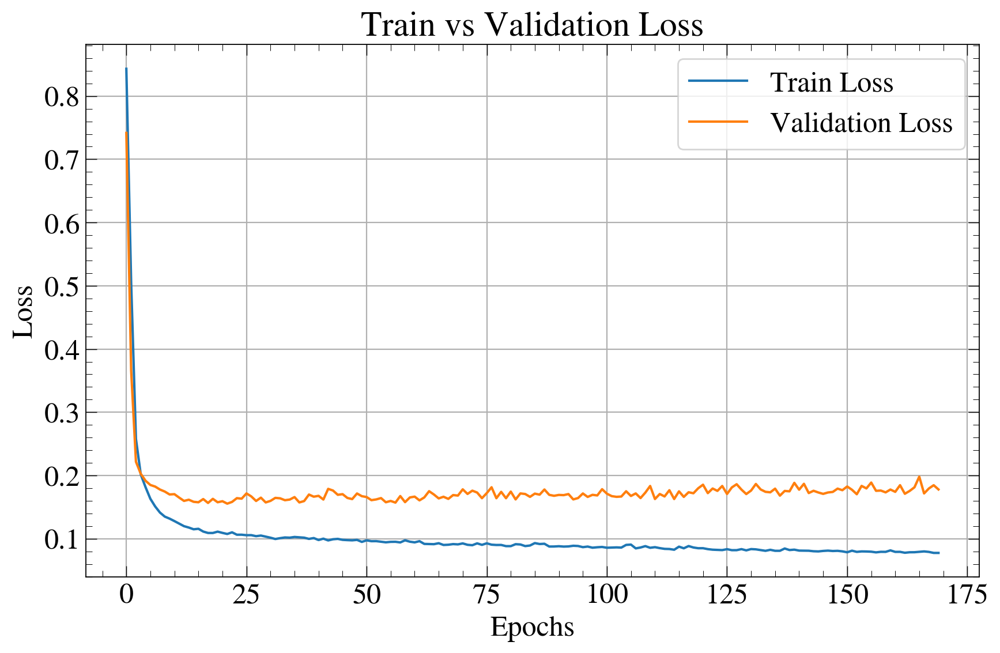

In [22]:
# Model hyperparameters
num_predictors = X_train_tensor_0.shape[1]
input_dim = num_predictors
hidden_dim = 64 #64, 128
output_dim = 1
dropout_rate = 0.25 #0.45, 0.25
num_epochs = 170
learning_rate = 1e-3
batch_size = 500
# hidden_dim = 64, dropout_rate = 0.25, learning_rate = 1e-4

# Initialize model, loss, and optimizer
model_mcd = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)

# Compute the loss (MSELoss for regression)
# criterion = F.mse_loss(outputs, targets)
criterion = nn.MSELoss()
optimizer = optim.Adam(model_mcd.parameters(), lr=learning_rate)

# Convert data to TensorDataset
dataset = TensorDataset(X_train_tensor_0, y_train_tensor_0)

# Split the data into train and validation sets
val_size = int(0.15 * len(dataset))    # use 15% of the training data for validation
train_size = len(dataset) - val_size  # Remaining 85% of the original train data for training

# Use random_split to divide the dataset
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create DataLoader with the batch size above for train and validation sets. We shuffle for the third time.
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


# Lists to store loss values
train_losses = []
val_losses = []

# Training loop
model_mcd.train()  # Set the model to training mode and ensure dropout is active during training
for epoch in range(num_epochs):
    train_loss = 0
    for i, (inputs, targets) in enumerate(train_loader):
        train_preds_mcd = model_mcd(inputs)
        loss = criterion(train_preds_mcd, targets)
        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward() #
        optimizer.step()
        
        # Accumulate training loss
        train_loss += loss.item()
            
        # # Print the loss every 100 batches 
        # if i % 100 == 0:
        #     print(f"Epoch [{epoch+1}/10], Batch [{i+1}/{len(dataloader)}], Loss: {loss.item()}")

        
    # Average training loss for the epoch
    train_loss /= len(train_loader)
    train_losses.append(train_loss)
        
    # Validate the model after each epoch
    model_mcd.eval()  # Set the model to evaluation mode
    val_loss = 0
    total = 0
    with torch.no_grad():  # No need to track gradients during validation
        for inputs, targets in val_loader:
            val_preds = model_mcd(inputs)
            loss = F.mse_loss(val_preds, targets)
            val_loss += loss.item()
            
    # Print the loss every 100 epochs
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}")

#     # Print the loss every 100 epochs (optional)
#     if (epoch + 1) % 100 == 0:
#         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")      
print("Training is complete")

# Plotting the train and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Train vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

#### Using KFold Cross-Validation
#### With Batch Size, Validation Set, and Cross-Validation
Cross-validation allows you to evaluate the model's performance on multiple subsets of the data and provides a more robust estimate of model performance by using different training and validation sets.

In [23]:
# from sklearn.model_selection import KFold

# # Model hyperparameters
# input_dim = 13
# hidden_dim = 128 #64
# output_dim = 1
# dropout_rate = 0.25 #0.45
# num_epochs = 1000
# learning_rate = 1e-2
# batch_size = 500

# # Initialize model, loss, and optimizer
# model_mcd = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)

# # Compute the loss (MSELoss for regression)
# # criterion = F.mse_loss(outputs, targets)
# criterion = nn.MSELoss()

# # Convert data to TensorDataset
# dataset = TensorDataset(X_train_tensor_0, y_train_tensor_0)

# # KFold Cross-Validation. We shuffle the data during the splitting.
# kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

# # Initialize lists to store the average losses for each fold
# train_losses = []
# val_losses = []

# # Perform KFold Cross-Validation
# for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
#     print(f"Training Fold {fold+1}")
    
#     # Create train and validation subsets using the indices
#     train_subset = torch.utils.data.Subset(dataset, train_idx)
#     val_subset = torch.utils.data.Subset(dataset, val_idx)

#     # Create DataLoader for train and validation sets
#     train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

#     # Initialize model for each fold
#     model = MCDropoutNet(input_dim, hidden_dim, output_dim, dropout_rate)

#     # Define optimizer
#     optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

#     # Training Loop
#     train_loss = 0
#     model_mcd.train()  # Set the model to training mode
#     for inputs, targets in train_loader:
#         optimizer.zero_grad()  # Zero the gradients
#         train_preds = model(inputs)  # Forward pass
#         loss = F.mse_loss(train_preds, targets)  # MSE loss for regression
#         loss.backward()  # Backpropagation
#         optimizer.step()  # Update model parameters
        
#         train_loss += loss.item()  # Accumulate training loss

#     # Average training loss for the fold
#     train_loss /= len(train_loader)
#     train_losses.append(train_loss)

#     # Validation Loop
#     val_loss = 0
#     model_mcd.eval()  # Set the model to evaluation mode
#     with torch.no_grad():  # No need to track gradients during validation
#         for inputs, targets in val_loader:
#             outputs = model(inputs)
#             loss = F.mse_loss(outputs, targets)
#             val_loss += loss.item()

#     # Average validation loss for the fold
#     val_loss /= len(val_loader)
#     val_losses.append(val_loss)
    
#     print(f"Fold {fold+1} - Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")
# print("Training is complete")
    
# # Plotting the train and validation loss across all folds
# plt.figure(figsize=(10, 6))
# plt.plot(train_losses, label="Train Loss")
# plt.plot(val_losses, label="Validation Loss")
# plt.title("Train vs Validation Loss Across Folds")
# plt.xlabel("Folds")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True)
# plt.show()

# # Final average losses across all folds
# avg_train_loss = sum(train_losses) / len(train_losses)
# avg_val_loss = sum(val_losses) / len(val_losses)

# print(f"Average Training Loss: {avg_train_loss:.4f}")
# print(f"Average Validation Loss: {avg_val_loss:.4f}")

### Monte Carlo Dropout Inference



In [24]:
def mc_dropout_predict(model, x, n_samples=100):
    model.train()  # Activate dropout during inference
    predictions = []
    with torch.no_grad():
        for _ in range(n_samples):
            preds = model(x)
            predictions.append(preds.cpu().numpy())
    predictions = np.array(predictions)  # Shape: (n_samples, batch_size, output_dim)
    return predictions

# Generate predictions with MC dropout
n_samples = 100
predictions_mcd = mc_dropout_predict(model_mcd, X_test_tensor, n_samples)

# # Compute mean and standard deviation
# pred_mean = mc_predictions.mean(axis=0).squeeze()   # shape: (batch_size,)
# pred_std = mc_predictions.std(axis=0).squeeze()

# # Take the inverse of the prediction to get the actual predictions.
# pred_mean_inv = scaler_y.inverse_transform(pred_mean.reshape(1, -1))[0]
# pred_std_inv = scaler_y.inverse_transform(pred_std.reshape(1, -1))[0]
# display(pred_mean_inv)
# display(pred_std_inv)

pred_mean_inv_mcd = []
pred_std_inv_mcd = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(predictions_mcd.shape[1]):
    pred_avg_mcd = np.mean(scaler_y.inverse_transform(predictions_mcd[:,i]))
    pred_mean_inv_mcd.append(float(pred_avg_mcd))
    
    pred_sd_mcd = np.std(scaler_y.inverse_transform(predictions_mcd[:,i]))
    pred_std_inv_mcd.append(float(pred_sd_mcd))
    
display(np.array(pred_mean_inv_mcd))
display(np.array(pred_std_inv_mcd))

array([1.1146642 , 0.99865448, 1.33066392, ..., 5.95733881, 1.19555211,
       8.41156864])

array([0.5233804 , 0.85839188, 0.7248174 , ..., 1.15491629, 0.45135108,
       2.6549418 ])

In [25]:
# mc_predictions.shape
y_test_copy

array([1.1900001, 0.97     , 1.49     , ..., 5.98     , 1.16     ,
       5.52     ])

### Visualize the Ensemble Predictions and Uncertainty

We plot the mean prediction along with the uncertainty bands (e.g., ±1 standard deviation).

Uncertainty Estimation: Here we use the mean and standard deviation of the predictions as an estimate of the prediction and its uncertainty, respectively.

In [26]:
# pred_mean_inv[0]#.reshape(-1, 1)[0]

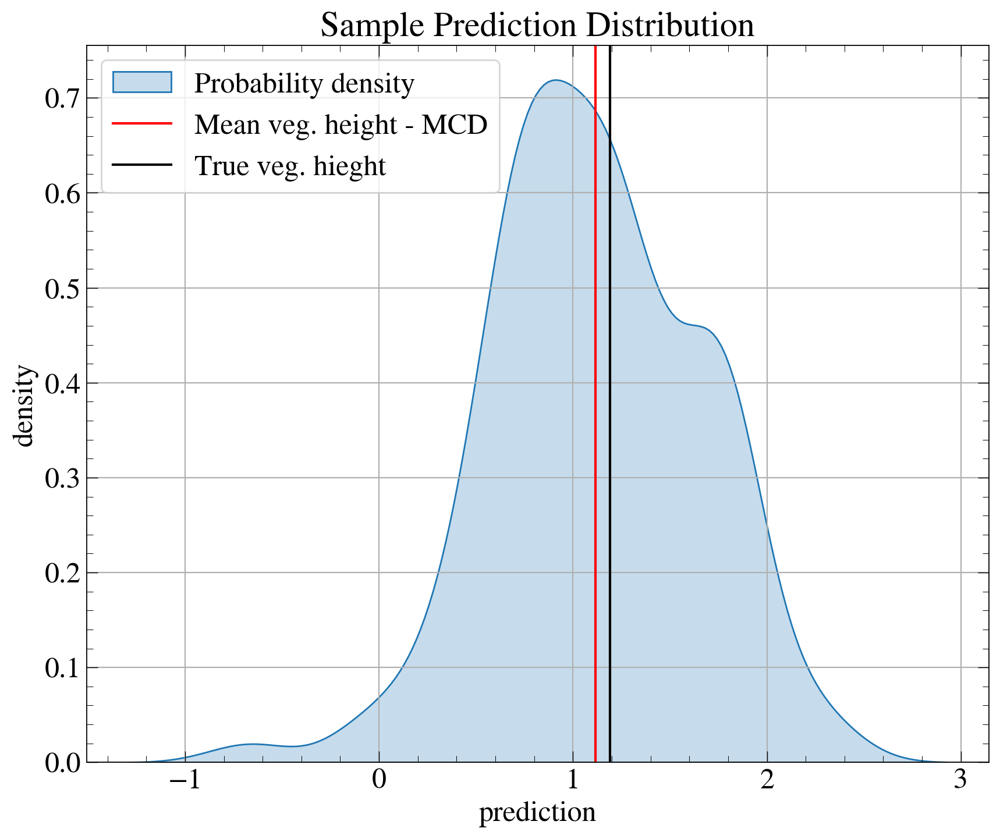

In [27]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(scaler_y.inverse_transform(predictions_mcd[:,n]), shade=True, label = "Probability density")
plt.axvline(pred_mean_inv_mcd[n], color='red', label = "Mean veg. height - MCD")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

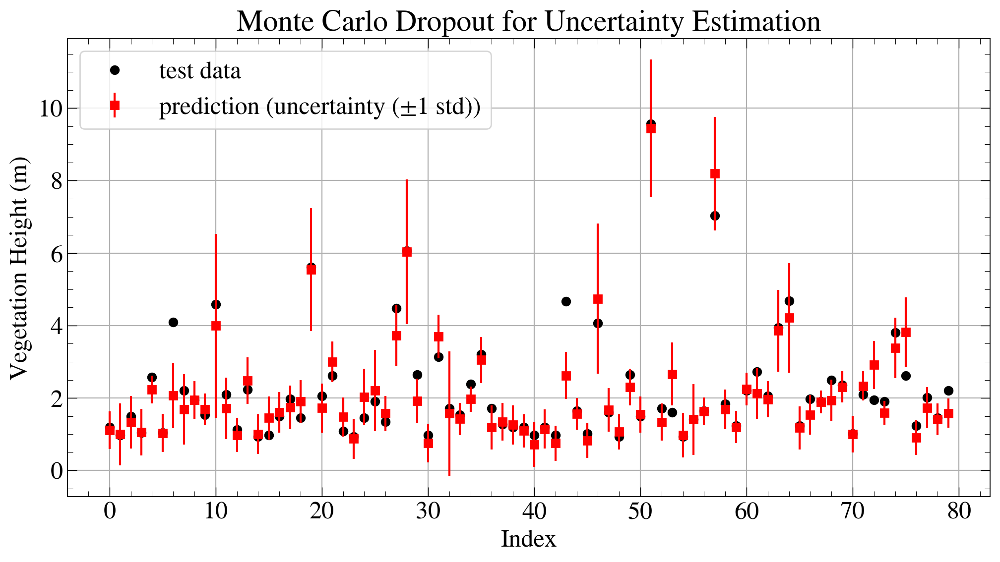

In [28]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[:k], 
             yerr = pred_std_inv_mcd[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Monte Carlo Dropout for Uncertainty Estimation")
plt.show()

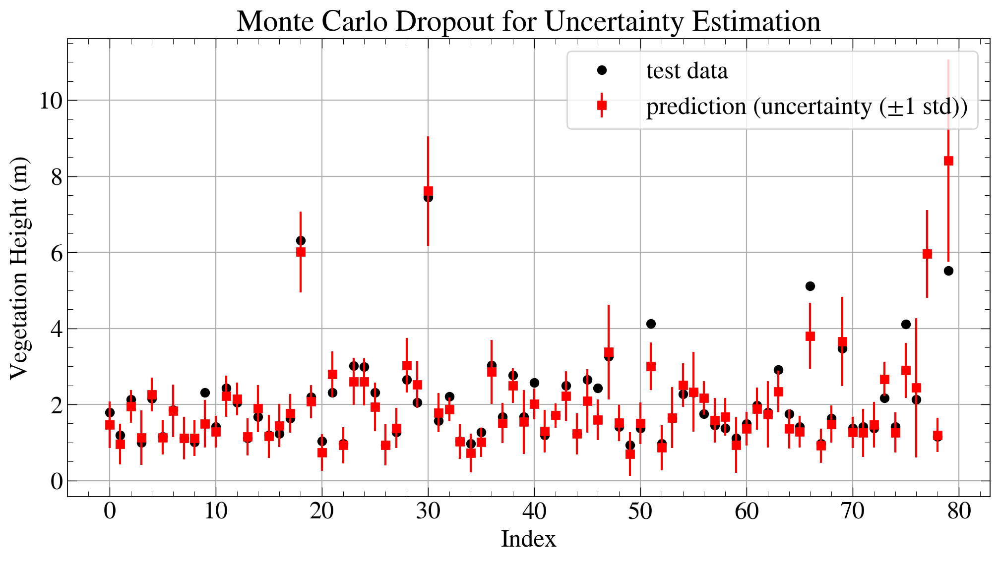

In [29]:
plt.figure(figsize=(12,6))
# k = 80
plt.plot(y_test_copy[-k:], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[-k:], 
             yerr = pred_std_inv_mcd[-k:], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Monte Carlo Dropout for Uncertainty Estimation")
plt.show()

#### Overlay Predictions on Map

In [30]:
import geopandas as gpd
import matplotlib.pyplot as plt
# import contextily as ctx
import numpy as np
from sliderule import sliderule

# Projected CRS
projected_crs = "epsg:6340"  # Horizontal transformation: The EPSG code for NAD83/UTM zone 11N is 26911 (1983) or 6340 (2011).
# Specify region of interest shapefile
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
shapefile = gpd.read_file(shp)
shapefile.crs is None
shapefile = shapefile.to_crs(projected_crs)
# shapefile.to_file('/bsuhome/tnde/geoscience/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson', driver='GeoJSON')

# Specify region of interest from geojson
poly_fn = '/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson'
pregion = gpd.read_file(poly_fn)
pregion = pregion.to_crs(projected_crs)
region = sliderule.toregion(poly_fn)["poly"] # symplify 

# Prepare coordinate lists for plotting the region of interest polygon
region_lon = [e["lon"] for e in region]
region_lat = [e["lat"] for e in region]

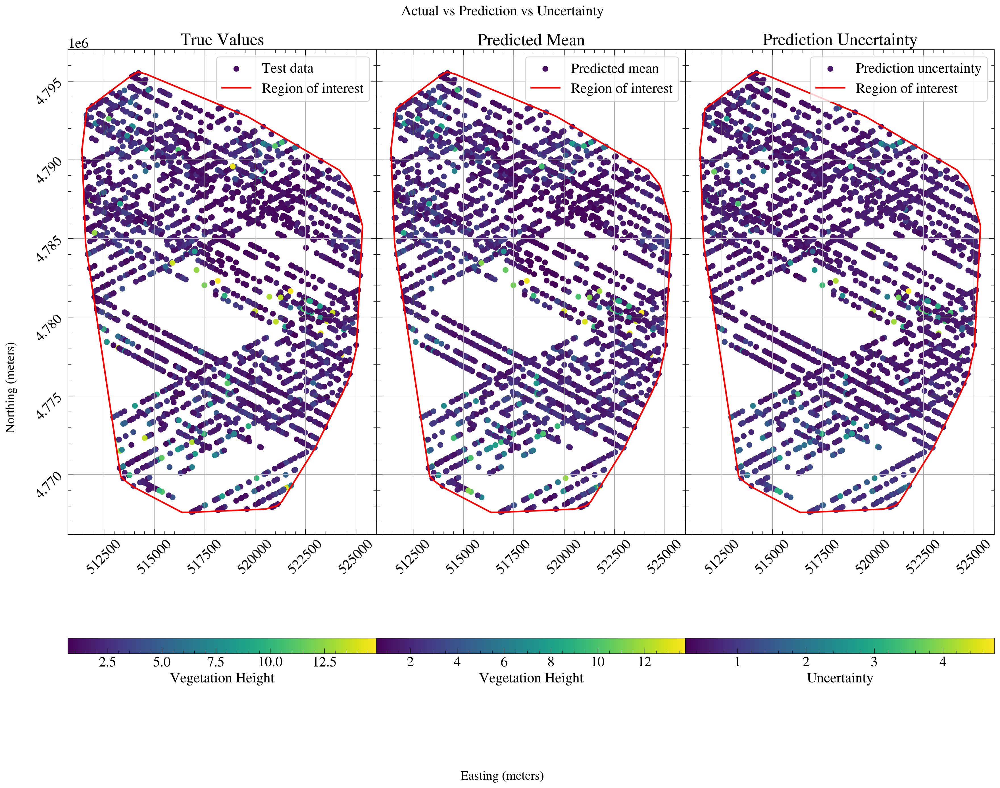

In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from sliderule import sliderule

# k = 300
k = len(y_test_copy)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
# ax[0].set_xlabel("Easting (meters)")
# ax[0].set_ylabel("Northing (meters)")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(pred_mean_inv_mcd)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
# ax[1].set_xlabel("Easting (meters)")
# ax[1].set_ylabel("Northing (meters)")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(pred_std_inv_mcd)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
# ax[2].set_xlabel("Easting (meters)")
# ax[2].set_ylabel("Northing (meters)")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
# Add a super title for the entire figure
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.25)
plt.show()

## Deep Ensembles

### Define Model Architecture: a Simple Neural Network

We define a simple feed-forward network for a regression task. Each model in the ensemble will have the same architecture but will be independently initialized and trained.

In [32]:
class SimpleNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        # self.dropout1 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        # self.dropout2 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        # self.dropout3 = nn.Dropout(0.5)  # Dropout for regularization
        self.fc4 = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        # x = self.dropout1(x)  # Dropout
        x = torch.relu(self.fc2(x))
        # x = self.dropout2(x)  # Dropout
        x = torch.relu(self.fc3(x))
        # x = self.dropout3(x)  # Dropout
        x = self.fc4(x)
        return x

# ############################################################
# class SimpleNet(nn.Module):
#     def __init__(self, input_dim, hidden_dim, output_dim):
#         super(SimpleNet, self).__init__()
#         # First hidden layer
#         self.fc1 = nn.Linear(input_dim, hidden_dim)
#         self.bn1 = nn.BatchNorm1d(hidden_dim)  # Batch Normalization
#         self.dropout1 = nn.Dropout(0.5)  # Dropout for regularization 0.65
        
#         # Second hidden layer
#         self.fc2 = nn.Linear(hidden_dim, hidden_dim)
#         self.bn2 = nn.BatchNorm1d(hidden_dim)  # Batch Normalization
#         self.dropout2 = nn.Dropout(0.5)  # Dropout for regularization 0.65
        
#         # third hidden layer
#         self.fc3 = nn.Linear(hidden_dim, hidden_dim)
#         self.bn3 = nn.BatchNorm1d(hidden_dim)  # Batch Normalization
#         self.dropout3 = nn.Dropout(0.5)  # Dropout for regularization 0.65
        
#         # Output layer
#         self.fc4 = nn.Linear(hidden_dim, output_dim)

#     def forward(self, x):
#         # First hidden layer -> LeakyReLU -> BatchNorm -> Dropout
#         x = self.fc1(x)
#         x = F.leaky_relu(x, negative_slope=0.1)  # Leaky ReLU activation
#         x = self.bn1(x)  # Batch Normalization
#         x = self.dropout1(x)  # Dropout
        
#         # Second hidden layer -> LeakyReLU -> BatchNorm -> Dropout
#         x = self.fc2(x)
#         x = F.leaky_relu(x, negative_slope=0.1)  # Leaky ReLU activation
#         x = self.bn2(x)  # Batch Normalization
#         x = self.dropout2(x)  # Dropout
        
#         # Third hidden layer -> LeakyReLU -> BatchNorm -> Dropout
#         x = self.fc3(x)
#         x = F.leaky_relu(x, negative_slope=0.1)  # Leaky ReLU activation
#         x = self.bn3(x)  # Batch Normalization
#         x = self.dropout3(x)  # Dropout
        
#         # Output layer (no activation for regression)
#         x = self.fc4(x)
#         return x

### Train an Ensemble of Models
Here we create and train several independent models. Each model is trained on the same data, but with different initial weights.

#### No Batch Size and Validation Set

In [33]:
# def train_model(model, x, y, num_epochs=500, learning_rate=0.01):
#     criterion = nn.MSELoss()
#     optimizer = optim.Adam(model.parameters(), lr=learning_rate)
#     model.train()
    
#     for epoch in range(num_epochs):
#         optimizer.zero_grad()
#         predictions = model(x)
#         loss = criterion(predictions, y)
#         loss.backward()
#         optimizer.step()
#     return model

# # Ensemble hyperparameters
# ensemble_size = 100
# input_dim = 13
# hidden_dim = 64
# output_dim = 1
# num_epochs = 200
# learning_rate = 1e-3

# # Train ensemble of models
# ensemble_models = []
# for i in range(ensemble_size):
#     model_de = SimpleNet(input_dim, hidden_dim, output_dim)
#     if (i + 1) % 10 == 0:
#         print(f"Training model {i+1}/{ensemble_size}...")
#     model_de = train_model(model_de, X_train_tensor_0, y_train_tensor_0, num_epochs, learning_rate)
#     ensemble_models.append(model_de)

#### With Batch Size But No Validation Set

In [34]:
# def train_model(model, x, y, num_epochs=500, learning_rate=0.01, batch_size=500):
#     # Create DataLoader for batching
#     dataset = TensorDataset(x, y)
#     dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    
#     criterion = nn.MSELoss()
#     optimizer = optim.Adam(model.parameters(), lr=learning_rate)
#     model.train()
    
#     for epoch in range(num_epochs):
#         for batch_idx, (inputs, targets) in enumerate(dataloader):
#             optimizer.zero_grad()
#             predictions = model(inputs)
#             loss = criterion(predictions, targets)
#             loss.backward()
#             optimizer.step()

#         # # Print the loss for every 10th epoch (for feedback)
#         # if (epoch + 1) % 10 == 0:
#         #     print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
    
#     return model

# # Ensemble hyperparameters
# ensemble_size = 50
# input_dim = 13
# hidden_dim = 64
# output_dim = 1
# num_epochs = 100
# learning_rate = 1e-3
# batch_size = 1000  # Set batch size 

# # Train ensemble of models
# ensemble_models = []
# for i in range(ensemble_size):
#     model_de = SimpleNet(input_dim, hidden_dim, output_dim)
#     if (i + 1) % 10 == 0:
#         print(f"Training model {i+1}/{ensemble_size}...")
#     model_de = train_model(model_de, X_train_tensor_0, y_train_tensor_0, num_epochs, learning_rate, batch_size)
#     ensemble_models.append(model_de)


#### With Batch Size and Validation Set

Training model 10/30...
Training model 20/30...
Training model 30/30...


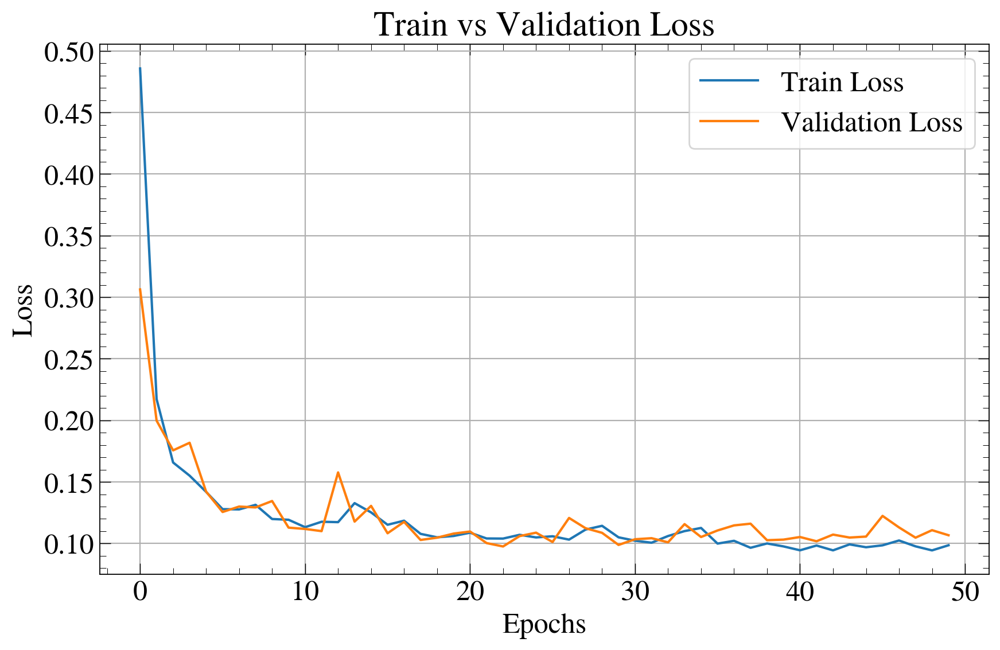

In [35]:
def train_model(model, X_train, y_train, X_val, y_val, num_epochs=500, learning_rate=0.01, batch_size=500):
    # Create DataLoader for batching
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    model.train()

    # Lists to store losses for plotting
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        # Training phase
        train_loss = 0
        for batch_idx, (inputs, targets) in enumerate(train_dataloader):
            optimizer.zero_grad()
            predictions = model(inputs)
            loss = criterion(predictions, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        # Calculate the average training loss for the epoch
        train_loss /= len(train_dataloader)
        train_losses.append(train_loss)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        val_loss = 0
        with torch.no_grad():
            for inputs, targets in val_dataloader:
                predictions = model(inputs)
                loss = criterion(predictions, targets)
                val_loss += loss.item()
        
        # Calculate the average validation loss for the epoch
        val_loss /= len(val_dataloader)
        val_losses.append(val_loss)

        # # Print the loss for every 10th epoch (for feedback)
        # if (epoch + 1) % 10 == 0:
        #     print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    return model, train_losses, val_losses

num_predictors = X_train_tensor_0.shape[1]
# Ensemble hyperparameters
ensemble_size = 30
input_dim = num_predictors
hidden_dim = 32 #32, 64, 128
output_dim = 1
num_epochs = 50
learning_rate = 1e-2
batch_size = 500  # 100  Set batch size

# Split the data into 85% training and 15% validation
X_train_tensor, X_val_tensor, y_train_tensor, y_val_tensor = train_test_split(X_train_tensor_0, y_train_tensor_0, test_size=0.15, random_state=42)

# Train ensemble of models
ensemble_models = []
for i in range(ensemble_size):
    model_de = SimpleNet(input_dim, hidden_dim, output_dim)
    if (i + 1) % 10 == 0:
        print(f"Training model {i+1}/{ensemble_size}...")
    model_de, train_losses, val_losses = train_model(model_de, X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, num_epochs, learning_rate, batch_size)
    ensemble_models.append(model_de)
    
    # Plot the loss curves for the last model
    if (i + 1) == ensemble_size:
        plt.figure(figsize=(10, 6))
        plt.plot(train_losses, label="Train Loss")
        plt.plot(val_losses, label="Validation Loss")
        plt.title("Train vs Validation Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.show()

#### Using KFold Cross-Validation
#### With Batch Size, Validation Set, and Cross-Validation

In [36]:
# # import torch
# # import torch.optim as optim
# # import torch.nn as nn
# # from torch.utils.data import DataLoader, TensorDataset
# from sklearn.model_selection import KFold
# # from sklearn.metrics import mean_squared_error
# # import matplotlib.pyplot as plt

# def train_model(model, X_train, y_train, X_val, y_val, num_epochs=500, learning_rate=0.01, batch_size=500):
#     # Create DataLoader for batching
#     train_dataset = TensorDataset(X_train, y_train)
#     val_dataset = TensorDataset(X_val, y_val)
#     train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
#     criterion = nn.MSELoss()
#     optimizer = optim.Adam(model.parameters(), lr=learning_rate)
#     model.train()

#     # Lists to store losses for plotting
#     train_losses = []
#     val_losses = []
    
#     for epoch in range(num_epochs):
#         # Training phase
#         train_loss = 0
#         for batch_idx, (inputs, targets) in enumerate(train_dataloader):
#             optimizer.zero_grad()
#             predictions = model(inputs)
#             loss = criterion(predictions, targets)
#             loss.backward()
#             optimizer.step()
#             train_loss += loss.item()
        
#         # Calculate the average training loss for the epoch
#         train_loss /= len(train_dataloader)
#         train_losses.append(train_loss)

#         # Validation phase
#         model.eval()  # Set the model to evaluation mode
#         val_loss = 0
#         with torch.no_grad():
#             for inputs, targets in val_dataloader:
#                 predictions = model(inputs)
#                 loss = criterion(predictions, targets)
#                 val_loss += loss.item()
        
#         # Calculate the average validation loss for the epoch
#         val_loss /= len(val_dataloader)
#         val_losses.append(val_loss)

#         # # Print the loss for every 10th epoch (for feedback)
#         # if (epoch + 1) % 10 == 0:
#         #     print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

#     return model, train_losses, val_losses

# # Ensemble hyperparameters
# ensemble_size = 100
# input_dim = 13
# hidden_dim = 64
# output_dim = 1
# num_epochs = 200
# learning_rate = 1e-3
# batch_size = 500  # Set batch size to 500

# # KFold Cross-Validation
# kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

# # Initialize lists to store the average losses for each fold
# train_losses = []
# val_losses = []

# # Cross-validation loop
# for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_tensor_0)):
#     print(f"\nTraining Fold {fold+1}")
    
#     # Create train and validation subsets using the indices
#     X_train, X_val = X_train_tensor_0[train_idx], X_train_tensor_0[val_idx]
#     y_train, y_val = y_train_tensor_0[train_idx], y_train_tensor_0[val_idx]

#     # Train and evaluate the model on this fold
#     model_de = SimpleNet(input_dim, hidden_dim, output_dim)
#     model_de, fold_train_losses, fold_val_losses = train_model(
#         model_de, X_train, y_train, X_val, y_val, num_epochs, learning_rate, batch_size)
    
#     # Append the losses for each fold
#     train_losses.append(fold_train_losses)
#     val_losses.append(fold_val_losses)

#     # Plot the loss curves after each fold (optional)
#     plt.figure(figsize=(10, 6))
#     plt.plot(fold_train_losses, label="Train Loss")
#     plt.plot(fold_val_losses, label="Validation Loss")
#     plt.title(f"Fold {fold+1} - Train vs Validation Loss")
#     plt.xlabel("Epochs")
#     plt.ylabel("Loss")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# # Calculate and print the average train and validation losses across all folds
# avg_train_losses = [np.mean([train_losses[i][j] for i in range(len(train_losses))]) for j in range(num_epochs)]
# avg_val_losses = [np.mean([val_losses[i][j] for i in range(len(val_losses))]) for j in range(num_epochs)]

# # Plot the average train and validation loss curves
# plt.figure(figsize=(10, 6))
# plt.plot(avg_train_losses, label="Average Train Loss")
# plt.plot(avg_val_losses, label="Average Validation Loss")
# plt.title("Average Train vs Validation Loss Across Folds")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True)
# plt.show()


### Inference with Deep Ensembles

During inference, each model in the ensemble produces its own prediction. The final prediction is obtained by averaging the predictions, and the variability across predictions provides a measure of uncertainty.

In [37]:
def ensemble_predict(models, x):
    preds = []
    for model in models:
        model.eval()  # Set each model to evaluation mode
        with torch.no_grad():
            pred = model(x)
            preds.append(pred.cpu().numpy())
    preds = np.array(preds)  # Shape: (ensemble_size, batch_size, output_dim)
    return preds

# Get ensemble predictions
ensemble_preds = ensemble_predict(ensemble_models, X_test_tensor)

# # Compute mean and standard deviation across the ensemble
# pred_mean_de = ensemble_preds.mean(axis=0).squeeze()  # (batch_size,)
# pred_std_de = ensemble_preds.std(axis=0).squeeze()

pred_mean_inv_de = []
pred_std_inv_de = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(ensemble_preds.shape[1]):
    pred_avg_de = np.mean(scaler_y.inverse_transform(ensemble_preds[:,i]))
    pred_mean_inv_de.append(float(pred_avg_de))
    
    pred_sd_de = np.std(scaler_y.inverse_transform(ensemble_preds[:,i]))
    pred_std_inv_de.append(float(pred_sd_de))
    
display(np.array(pred_mean_inv_de))
display(np.array(pred_std_inv_de))
y_test_copy

array([1.14774287, 1.04983413, 1.28929746, ..., 6.10354137, 1.27462709,
       8.94241333])

array([0.06915177, 0.06638207, 0.066267  , ..., 0.39454404, 0.05265063,
       0.70254141])

array([1.1900001, 0.97     , 1.49     , ..., 5.98     , 1.16     ,
       5.52     ])

In [38]:
# len(ensemble_preds[:,0])
ensemble_preds.shape

(30, 2559, 1)

### Visualize the Results
Finally, we plot the ensemble’s mean prediction along with uncertainty bands (e.g., ±1 standard deviation).

Uncertainty Estimation: Here we use the mean and standard deviation of the predictions as an estimate of the prediction and its uncertainty, respectively.

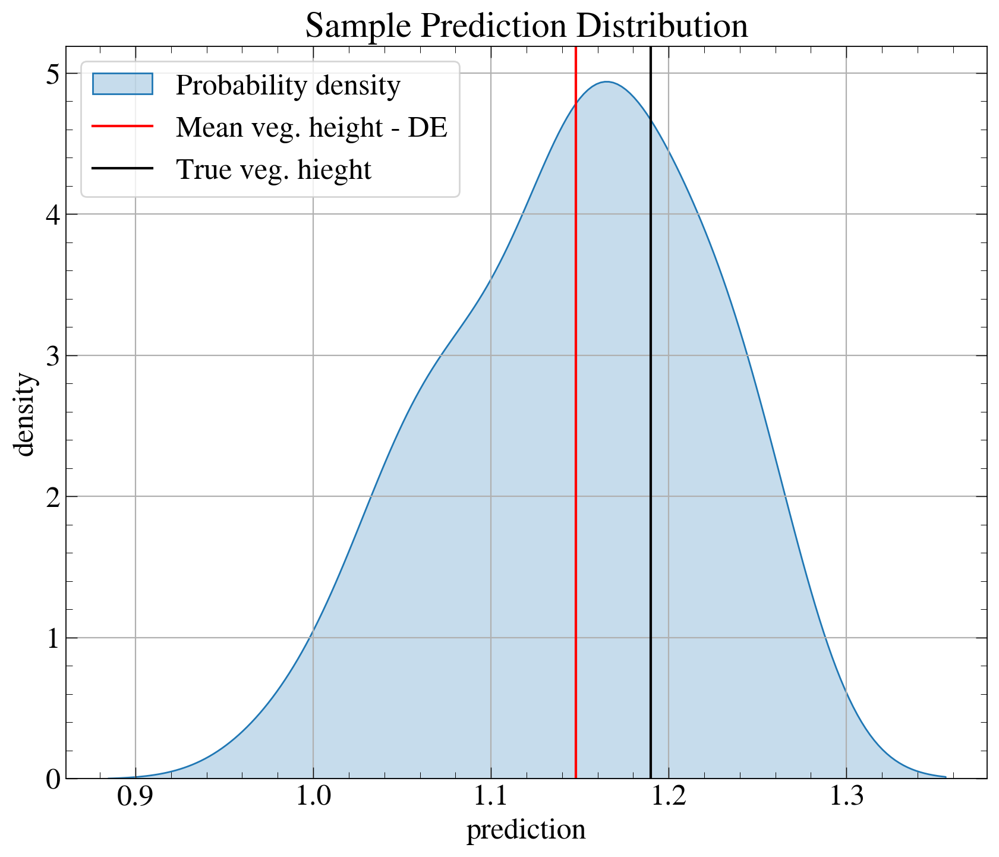

In [39]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(scaler_y.inverse_transform(ensemble_preds[:,n]), shade=True, label = "Probability density")
plt.axvline(pred_mean_inv_de[n], color='red', label = "Mean veg. height - DE")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

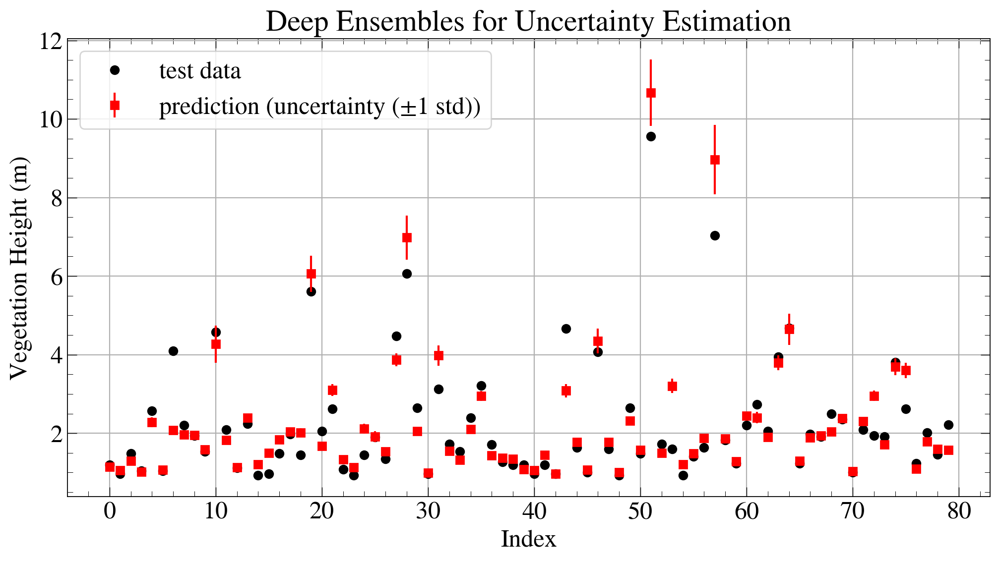

In [40]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[:k], 
             yerr = pred_std_inv_de[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Deep Ensembles for Uncertainty Estimation")
plt.show()

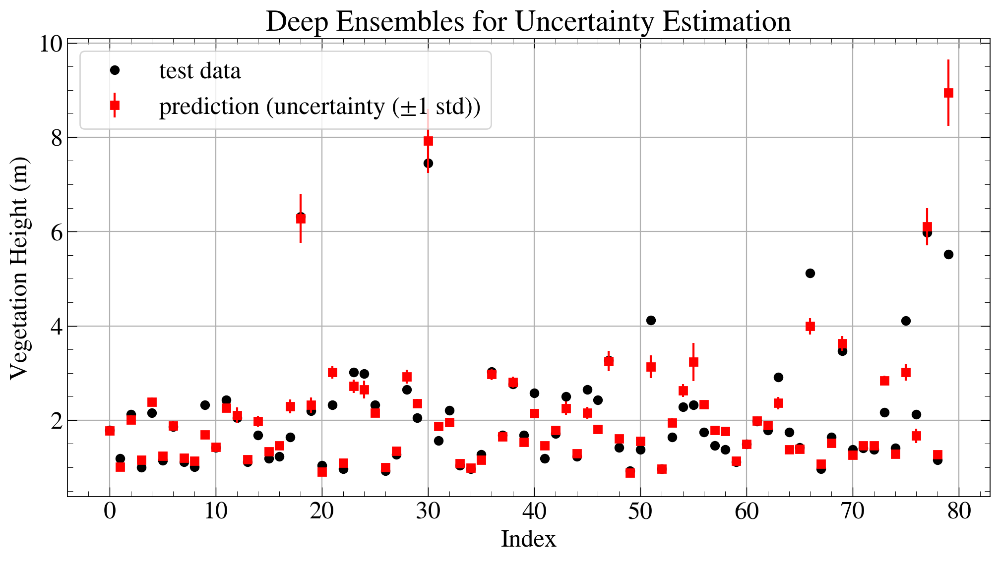

In [41]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[-k:], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[-k:], 
             yerr = pred_std_inv_de[-k:], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Deep Ensembles for Uncertainty Estimation")
plt.show()

#### Overlay Predictions on Map

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
# import contextily as ctx
import numpy as np
from sliderule import sliderule

# Projected CRS
projected_crs = "epsg:6340"  # Horizontal transformation: The EPSG code for NAD83/UTM zone 11N is 26911 (1983) or 6340 (2011).
# Specify region of interest shapefile
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
shapefile = gpd.read_file(shp)
shapefile.crs is None
shapefile = shapefile.to_crs(projected_crs)
# shapefile.to_file('/bsuhome/tnde/geoscience/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson', driver='GeoJSON')

# Specify region of interest from geojson
poly_fn = '/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson'
pregion = gpd.read_file(poly_fn)
pregion = pregion.to_crs(projected_crs)
region = sliderule.toregion(poly_fn)["poly"] # symplify 

# Prepare coordinate lists for plotting the region of interest polygon
region_lon = [e["lon"] for e in region]
region_lat = [e["lat"] for e in region]

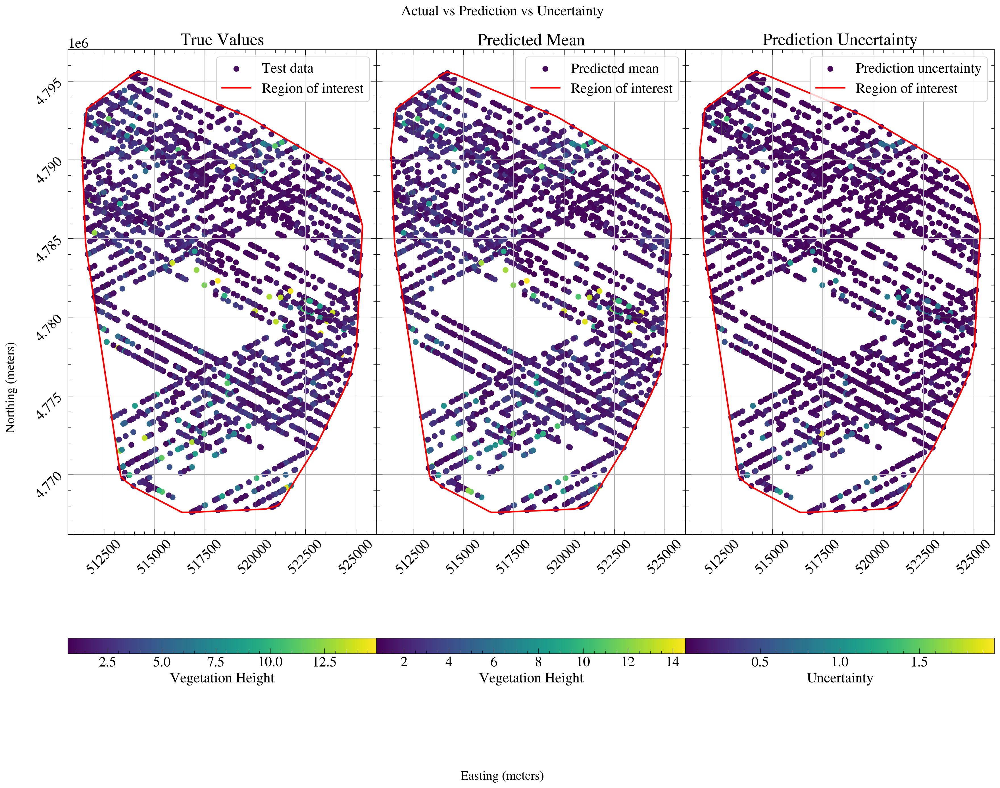

In [43]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from sliderule import sliderule

# k = 300
k = len(y_test_copy)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
# ax[0].set_xlabel("Easting (meters)")
# ax[0].set_ylabel("Northing (meters)")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(pred_mean_inv_de)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
# ax[1].set_xlabel("Easting (meters)")
# ax[1].set_ylabel("Northing (meters)")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(pred_std_inv_de)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
# ax[2].set_xlabel("Easting (meters)")
# ax[2].set_ylabel("Northing (meters)")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
# Add a super title for the entire figure
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.25)
plt.show()

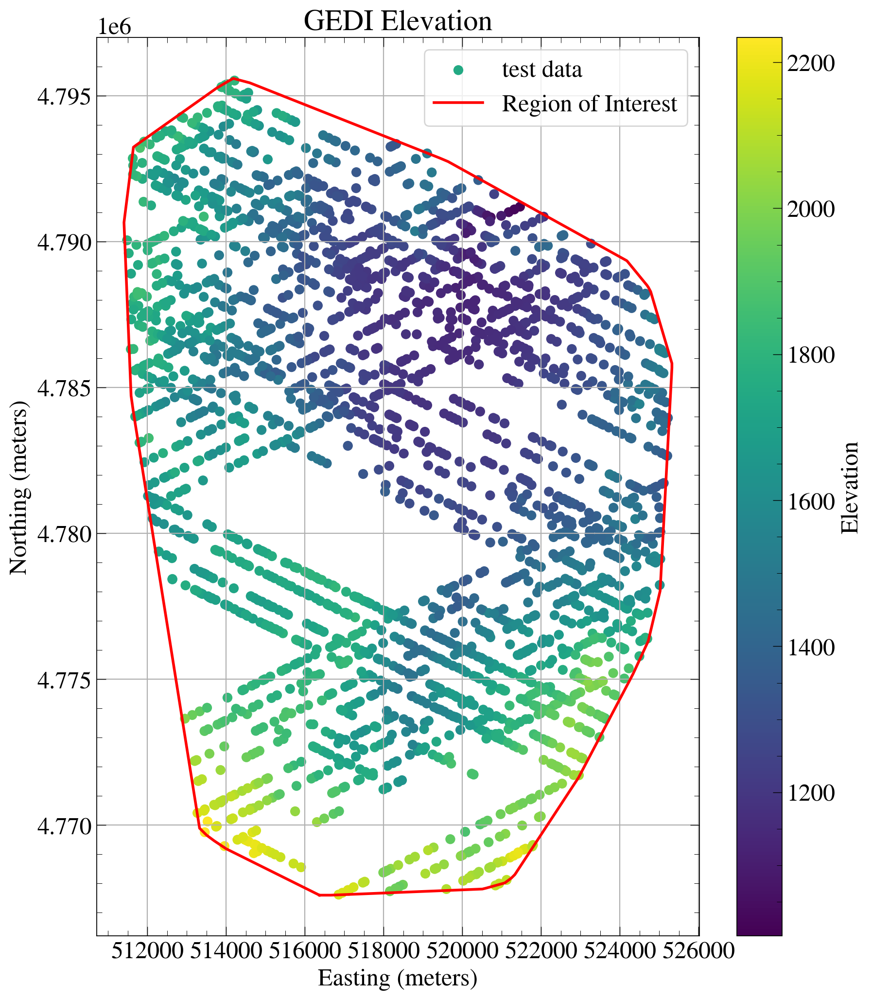

In [44]:
import geopandas as gpd
import matplotlib.pyplot as plt
# import contextily as ctx
import numpy as np
from sliderule import sliderule

# Projected CRS
projected_crs = "epsg:6340"  # Horizontal transformation: The EPSG code for NAD83/UTM zone 11N is 26911 (1983) or 6340 (2011).
# Specify region of interest shapefile
shp = "/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.shp"
shapefile = gpd.read_file(shp)
shapefile.crs is None
shapefile = shapefile.to_crs(projected_crs)
# shapefile.to_file('/bsuhome/tnde/geoscience/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson', driver='GeoJSON')

# Specify region of interest from geojson
poly_fn = '/bsuhome/tnde/geoscience/carbon_estimation/RCEW_shapefile_josh/RCEW_Boundary.geojson'
pregion = gpd.read_file(poly_fn)
pregion = pregion.to_crs(projected_crs)
region = sliderule.toregion(poly_fn)["poly"] # symplify 

# Prepare coordinate lists for plotting the region of interest polygon
region_lon = [e["lon"] for e in region]
region_lat = [e["lat"] for e in region]


# Plot the merged dataset
fig, ax = plt.subplots(figsize=(10, 12))

# k = 300
k = len(y_test_copy)
# Create a scatter plot where color is based on 'rh_100' values
scatter = ax.scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                     c=X_test_copy[:, 6][:k], cmap="viridis", s=40, alpha=1.0, label="test data")

# scatter = ax.scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
#                      c=np.array(pred_mean_inv_de), cmap="viridis", s=40, alpha=1.0, label="test data")

# Plot the region boundary
ax.plot(region_lon, region_lat, linewidth=2, color="r", label="Region of Interest")

# Add a color bar to the plot
cbar = plt.colorbar(scatter, ax=ax, orientation="vertical")
cbar.set_label("Elevation")

# Add a basemap (Optional)
# ctx.add_basemap(ax, crs=final_merged_gdf.crs, source=ctx.providers.Esri.WorldImagery)

# Formatting the map
plt.legend()
plt.title("GEDI Elevation")
plt.xlabel("Easting (meters)")
plt.ylabel("Northing (meters)")
plt.show()


In [45]:
len(X_test_copy[:, 4])

2559

## AutoDEUQ - DeepHyper Uncertainty Quantification.

In [46]:
# Ensemble Generation: AutoDEUQ automates the process of creating deep neural network ensembles by performing a joint search for optimal neural architecture and hyperparameters for each ensemble member.
# Uncertainty Quantification: It quantifies uncertainty by decomposing the predictive variance of the ensemble into two components:
# Aleatoric Uncertainty: Represents the inherent noise or variability in the data itself.
# Epistemic Uncertainty: Reflects the uncertainty in the model's parameters and increases in regions of the input space that are not well-represented in the training data.
# Automated Approach: Unlike traditional methods that require manual effort in selecting network architectures and hyperparameters for each ensemble member, AutoDEUQ streamlines this process through automation.
# Improved Performance: AutoDEUQ has been shown to outperform various other uncertainty quantification methods, including probabilistic backpropagation, Monte Carlo dropout, deep ensembles, distribution-free ensembles, and hyper ensembles, on a range of regression benchmarks. 

# Key Concepts:
# Deep Neural Networks (DNNs): Powerful models for various tasks but typically lack direct uncertainty capture.
# Ensemble Methods: Combine multiple models to improve performance and provide uncertainty estimates.
# Neural Architecture Search (NAS): Automates the design of neural network architectures.
# Hyperparameter Optimization (HPO): Finds optimal hyperparameter values for training neural networks.
# Law of Total Variance: Used to decompose the predictive variance of the ensemble into aleatoric and epistemic uncertainties. 
# In essence, AutoDEUQ aims to make the benefits of deep ensembles for uncertainty quantification more accessible and efficient by automating the often-complex process of building the ensemble itself. 

In [47]:
# How to list conda environments with their associated Python versions
# conda env list | grep -v "^$\|#" |awk '{print $1;}'|xargs -I{} -d "\n" sh -c 'printf "Env: {}\t"; conda list -n {} |grep "^python\s";'

In [48]:
import json
import os
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from tqdm import tqdm

WIDTH_PLOTS = 8
HEIGHT_PLOTS = WIDTH_PLOTS / 1.618

In [49]:
# is_gpu_available = torch.cuda.is_available()
# n_gpus = torch.cuda.device_count()

### Configurable Neural Network with Uncertainty

In [50]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

class DeepNormalRegressor(nn.Module):
    def __init__(
        self,
        n_inputs,
        layers,
        # n_units_mean=8,
        # n_units_std=8,
        n_units_mean=64,
        n_units_std=64,
        std_offset=1e-1,
        # std_offset=0.0,
        # softplus_factor=0.05,
        softplus_factor=1.0,
        loc=0,
        scale=1.0,
    ):
        super().__init__()

        layers_ = []
        prev_n_units = n_inputs
        for n_units, activation, dropout_rate in layers:
            linear_layer = nn.Linear(prev_n_units, n_units)
            if activation == "relu":
                activation_layer = nn.ReLU()
            elif activation == "leaky_relu":
                activation_layer = nn.LeakyReLU()
            elif activation == "sigmoid":
                activation_layer = nn.Sigmoid()
            elif activation == "tanh":
                activation_layer = nn.Tanh()
            elif activation == "swish":
                activation_layer = nn.SiLU()
            elif activation == "mish":
                activation_layer = nn.Mish()
            elif activation == "gelu":
                activation_layer = nn.GELU()
            elif activation == "silu":
                activation_layer = nn.SiLU()
            dropout_layer = nn.Dropout(dropout_rate)

            layers_.extend([linear_layer, activation_layer, dropout_layer])

            prev_n_units = n_units

        # Shared parameters
        self.shared_layer = nn.Sequential(
            *layers_,
        )

        # Mean parameters
        self.mean_layer = nn.Sequential(
            nn.Linear(prev_n_units, n_units_mean),
            # nn.ReLU(),
            nn.LeakyReLU(),
            nn.Linear(n_units_mean, 1),
        )

        # Standard deviation parameters
        self.std_layer = nn.Sequential(
            nn.Linear(prev_n_units, n_units_std),
            # nn.ReLU(),
            nn.LeakyReLU(),
            nn.Linear(n_units_std, 1),
            # nn.Softplus(beta=1.0, threshold=20.0),  # enforces positivity
            nn.Softplus(beta=1.0, threshold=10.0),  # enforces positivity
        )

        self.std_offset = std_offset
        self.softplus_factor = softplus_factor
        self.loc = loc
        self.scale = scale

    def forward(self, x):
        # Shared embedding
        shared = self.shared_layer(x)

        # Parametrization of the mean
        mu = self.mean_layer(shared) + self.loc

        # Parametrization of the standard deviation
        sigma = self.std_offset + self.std_layer(self.softplus_factor * shared) * self.scale
        
        # # more controlled version of the parametrization of the standard deviation above
        # # option 1
        # raw_std = self.std_layer(self.softplus_factor * shared)
        # sigma = self.std_offset + torch.clamp(raw_std * self.scale, min=1e-4, max=1.5)
        
        # # option 2
        # log_sigma = self.std_layer(shared)
        # sigma = torch.exp(log_sigma) + self.std_offset

        # # Predict the log of variance (or log sigma) to stabilize training and improve numeric robustness
        # log_sigma = self.std_layer(shared)  # no Softplus
        # sigma = torch.exp(log_sigma) + self.std_offset
        
        # # best so far
        # # Prevent sigma from exploding using a torch.clamp(). Choose max based on domain knowledge. 
        # # For instance, if target range is 0–15, then sigma > 2.0 might be unreasonable. This sharpens the curve and discourages large output.
        # raw_sigma = self.std_layer(self.softplus_factor*(shared))
        # sigma = self.std_offset + torch.clamp(raw_sigma * self.scale, min=1e-4, max=1.0)
        
        # # Use Softplus with tighter control. The Softplus function works well if you adjust its input scale more aggressively
        # soft_input = self.softplus_factor * shared
        # sigma = self.std_offset + F.softplus(self.std_layer(soft_input), beta=1.0) * self.scale
        
        # # Apply a tanh or sigmoid to squash std output. Another option is to squash std to a known range using sigmoid or tanh. This ensures output lies in a controlled range.
        # raw = self.std_layer(shared)
        # max_std = 2
        # sigma = self.std_offset + torch.sigmoid(raw) * max_std  # e.g., max_std = 1.5

        return torch.distributions.Normal(mu, sigma)

### Hyperparameter Search Space

In [51]:
from ConfigSpace import GreaterThanCondition
from deephyper.hpo import HpProblem

def create_hpo_problem(min_num_layers=3, max_num_layers=8, max_num_units=512): # 256
    problem = HpProblem()

    # Neural Architecture Hyperparameters
    num_layers = problem.add_hyperparameter((min_num_layers, max_num_layers), "num_layers", default_value=3)

    conditions = []
    for i in range(max_num_layers):

        # Adding the hyperparameters that impact each layer of the model
        layer_i_units = problem.add_hyperparameter((64, max_num_units), f"layer_{i}_units", default_value=max_num_units)
        layer_i_activation = problem.add_hyperparameter(
            ["relu", "leaky_relu", "sigmoid", "tanh", "swish", "mish", "gelu", "silu"],
            # ["relu", "leaky_relu", "swish", "mish", "gelu", "silu"],
            f"layer_{i}_activation",
            default_value="leaky_relu",
        )
        layer_i_dropout_rate = problem.add_hyperparameter(
            (0.0, 0.5), f"layer_{i}_dropout_rate", default_value=0.0
        )

        # Adding the constraints to define when these hyperparameters are active
        if i + 1 > min_num_layers:
            conditions.extend(
                [
                    GreaterThanCondition(layer_i_units, num_layers, i),
                    GreaterThanCondition(layer_i_activation, num_layers, i),
                    GreaterThanCondition(layer_i_dropout_rate, num_layers, i),
                ]
            )

    problem.add_conditions(conditions)

    # # Hyperparameters of the output layers
    # problem.add_hyperparameter((8, max_num_units), "n_units_mean", default_value=max_num_units)
    # problem.add_hyperparameter((8, max_num_units), "n_units_std", default_value=max_num_units)
    # problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "std_offset", default_value=5e-2)
    # problem.add_hyperparameter((0.1, 10), "softplus_factor", default_value=1)

    # # Training Hyperparameters
    # problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "learning_rate", default_value=1e-2)
    # problem.add_hyperparameter((200, 1500, "log-uniform"), "batch_size", default_value=500)
    # problem.add_hyperparameter((0.01, 0.99), "lr_scheduler_factor", default_value=0.1)
    # problem.add_hyperparameter((5, 50), "lr_scheduler_patience", default_value=20)
    
    # Hyperparameters of the output layers
    problem.add_hyperparameter((64, max_num_units), "n_units_mean", default_value=max_num_units)
    problem.add_hyperparameter((64, max_num_units), "n_units_std", default_value=max_num_units)
    problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "std_offset", default_value=1e-3)
    problem.add_hyperparameter((0.1, 10), "softplus_factor", default_value=1)

    # Training Hyperparameters
    problem.add_hyperparameter((1e-5, 1e-1, "log-uniform"), "learning_rate", default_value=1e-3)
    problem.add_hyperparameter((200, 1500, "log-uniform"), "batch_size", default_value=500)
    problem.add_hyperparameter((0.01, 0.99), "lr_scheduler_factor", default_value=0.1)
    problem.add_hyperparameter((5, 20), "lr_scheduler_patience", default_value=10)
    
    
    return problem

problem = create_hpo_problem()
problem

Configuration space object:
  Hyperparameters:
    batch_size, Type: UniformInteger, Range: [200, 1500], Default: 500, on log-scale
    layer_0_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_0_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_0_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_1_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_1_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_1_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_2_activation, Type: Categorical, Choices: {relu, leaky_relu, sigmoid, tanh, swish, mish, gelu, silu}, Default: leaky_relu
    layer_2_dropout_rate, Type: UniformFloat, Range: [0.0, 0.5], Default: 0.0
    layer_2_units, Type: UniformInteger, Range: [64, 512], Default: 512
    layer_3_activation

### Loss and Metric

In [52]:
def nll(y, rv_y):
    """
    Negative log likelihood for Pytorch distribution.

    Args:
        y: true data.
        rv_y: learned (predicted) probability distribution.
    """
    return -rv_y.log_prob(y)


# # Regularize the std prediction
# # Adding a penalty to the log sigma values to discourage large uncertainties
# def nll(y, rv_y, lambda_reg=1e-1):
#     return -rv_y.log_prob(y) + lambda_reg * rv_y.scale.mean()


def squared_error(y_true, rv_y):
    """
    Squared error for Pytorch distribution.

    Args:
        y: true data.
        rv_y: learned (predicted) probability distribution.
    """
    y_pred = rv_y.mean
    return (y_true - y_pred)**2

### Training Loop

In [53]:
def train_one_step(model, optimizer, x_batch, y_batch):
    model.train()
    optimizer.zero_grad()
    y_dist = model(x_batch)

    loss = torch.mean(nll(y_batch, y_dist))
    mse = torch.mean(squared_error(y_batch, y_dist))

    loss.backward()
    optimizer.step()

    return loss, mse

def train(
    job,
    model,
    optimizer,
    x_train,
    x_val,
    y_train,
    y_val,
    n_epochs,
    batch_size,
    scheduler=None,
    # patience=200,
    patience=20,
    progressbar=True,
):
    data_train = DataLoader(TensorDataset(x_train, y_train), batch_size=batch_size, shuffle=True)

    checkpointed_state_dict = model.state_dict()
    checkpointed_val_loss = np.inf

    train_loss, val_loss = [], []
    train_mse, val_mse = [], []

    tqdm_bar = tqdm(total=n_epochs, disable=not progressbar)

    for epoch in range(n_epochs):
        batch_losses_t, batch_losses_v, batch_mse_t, batch_mse_v = [], [], [], []

        for batch_x, batch_y in data_train:
            b_train_loss, b_train_mse = train_one_step(model, optimizer, batch_x, batch_y)

            model.eval()
            y_dist = model(x_val)
            b_val_loss = torch.mean(nll(y_val, y_dist))
            b_val_mse = torch.mean(squared_error(y_val, y_dist))

            batch_losses_t.append(to_numpy(b_train_loss))
            batch_mse_t.append(to_numpy(b_train_mse))
            batch_losses_v.append(to_numpy(b_val_loss))
            batch_mse_v.append(to_numpy(b_val_mse))

        train_loss.append(np.mean(batch_losses_t))
        val_loss.append(np.mean(batch_losses_v))
        train_mse.append(np.mean(batch_mse_t))
        val_mse.append(np.mean(batch_mse_v))

        if scheduler is not None:
            scheduler.step(val_loss[-1])

        tqdm_bar.update(1)
        tqdm_bar.set_postfix(
            {
                "train_loss": f"{train_loss[-1]:.3f}",
                "val_loss": f"{val_loss[-1]:.3f}",
                "train_mse": f"{train_mse[-1]:.3f}",
                "val_mse": f"{val_mse[-1]:.3f}",
            }
        )

        # Checkpoint weights if they improve
        if val_loss[-1] < checkpointed_val_loss:
            checkpointed_val_loss = val_loss[-1]
            checkpointed_state_dict = model.state_dict()

        # Early discarding
        job.record(budget=epoch+1, objective=-val_loss[-1])
        if job.stopped():
            break

        if len(val_loss) > (patience + 1) and val_loss[-patience - 1] < min(val_loss[-patience:]):
            break

    # Reload the best weights
    model.load_state_dict(checkpointed_state_dict)
    return train_loss, val_loss, train_mse, val_mse

### Run Time

In [54]:
import multiprocessing

dtype = torch.float32
if torch.cuda.is_available():
    device = "cuda"
    device_count = 1
else:
    device = "cpu"
    device_count = multiprocessing.cpu_count()

print(f"Runtime with {device=}, {device_count=}, {dtype=}")

Runtime with device='cpu', device_count=48, dtype=torch.float32


### Conversion Utility Functions

In [55]:
def to_torch(array):
    return torch.from_numpy(array).to(device=device, dtype=dtype)

def to_numpy(tensor):
    return tensor.detach().cpu().numpy()

### Evaluation Function

In [56]:
num_predictors = X_train_tensor_0.shape[1]
def create_model(parameters: dict, y_mu=0.0, y_std=1.0):
    num_layers = parameters["num_layers"]
    torch_module = DeepNormalRegressor(
        n_inputs=num_predictors,
        layers=[
            (
                parameters[f"layer_{i}_units"],
                parameters[f"layer_{i}_activation"],
                parameters[f"layer_{i}_dropout_rate"],
            )
            for i in range(num_layers)
        ],
        n_units_mean=parameters["n_units_mean"],
        n_units_std=parameters["n_units_std"],
        std_offset=parameters["std_offset"],
        softplus_factor=parameters["softplus_factor"],
        loc=y_mu,
        scale=y_std,
    ).to(device=device, dtype=dtype)
    return torch_module

In [57]:
# np.mean(np.array(y_train_tensor))

In [58]:
# Split the data into 85% training and 15% validation
X_train_tensor, X_val_tensor, y_train_tensor, y_val_tensor = train_test_split(X_train_tensor_0, y_train_tensor_0, test_size=0.15, random_state=42)
y_mu, y_std = np.mean(np.array(y_train_tensor)), np.std(np.array(y_train_tensor))

# max_n_epochs = 1_000
max_n_epochs = 300

def run(job, model_checkpoint_dir=".", verbose=False):
    (x, y) = (X_train_tensor, y_train_tensor) # training data
    (vx, vy) = (X_val_tensor, y_val_tensor) # validation data
    (tx, ty) = (X_test_tensor, y_test_tensor) # test data

    # Create the model based on neural architecture hyperparameters
    model = create_model(job.parameters, y_mu, y_std)
    # model = create_model(job.parameters)

    if verbose:
        print(model)

    # Initialize training loop based on training hyperparameters
    # optimizer = torch.optim.Adam(model.parameters(), lr=job.parameters["learning_rate"])
    optimizer = torch.optim.Adagrad(model.parameters(), lr=job.parameters["learning_rate"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        factor=job.parameters["lr_scheduler_factor"],
        patience=job.parameters["lr_scheduler_patience"],
    )

    # x, vx, tx = to_torch(x), to_torch(vx), to_torch(tx)
    # y, vy, ty = to_torch(y), to_torch(vy), to_torch(ty)

    try:
        train_losses, val_losses, train_mse, val_mse = train(
            job,
            model,
            optimizer,
            x,
            vx,
            y,
            vy,
            n_epochs=max_n_epochs,
            batch_size=job.parameters["batch_size"],
            scheduler=scheduler,
            progressbar=verbose,
        )
    except Exception:
        return "F_fit"

    ty_pred = model(tx)
    test_loss = to_numpy(torch.mean(nll(ty, ty_pred)))
    test_mse = to_numpy(torch.mean(squared_error(ty, ty_pred)))

    # Saving the model's state (i.e., weights)
    torch.save(model.state_dict(), os.path.join(model_checkpoint_dir, f"model_{job.id}.pt"))

    return {
        "objective": -val_losses[-1],
        "metadata": {
            "train_loss": train_losses,
            "val_loss": val_losses,
            "train_mse": train_mse,
            "val_mse": val_mse,
            "test_loss": test_loss,
            "test_mse": test_mse,
            "budget": len(val_losses),
        },
    }

In [59]:
# scaler_y.inverse_transform(np.array(y_mu).reshape(-1, 1))
# # np.array(y_mu)

### Evaluation of the Baseline

In [60]:
import os
import shutil
from deephyper.evaluator import RunningJob

# nas_baseline_regression_gedi_3 # This is the final run
baseline_dir = "nas_baseline_regression_gedi_final2"
# Check and delete if directory path exists

# baseline_path = os.path.join(os.getcwd(), baseline_dir)
# if os.path.isdir(baseline_path):
#     shutil.rmtree(baseline_path)
#     print(f"Deleted directory: {baseline_path}")
# else:
#     print("Directory does not exist")
#     pass

def evaluate_baseline(problem):
    model_checkpoint_dir = os.path.join(baseline_dir, "models")
    pathlib.Path(model_checkpoint_dir).mkdir(parents=True, exist_ok=True)

    default_parameters = problem.default_configuration
    print(f"{default_parameters=}\n")

    result = run(
        RunningJob(parameters=default_parameters),
        model_checkpoint_dir=model_checkpoint_dir,
        verbose=True,
    )
    return result

baseline_results = evaluate_baseline(problem)

default_parameters={'batch_size': 500, 'layer_0_activation': 'leaky_relu', 'layer_0_dropout_rate': 0.0, 'layer_0_units': 512, 'layer_1_activation': 'leaky_relu', 'layer_1_dropout_rate': 0.0, 'layer_1_units': 512, 'layer_2_activation': 'leaky_relu', 'layer_2_dropout_rate': 0.0, 'layer_2_units': 512, 'learning_rate': 0.001, 'lr_scheduler_factor': 0.1, 'lr_scheduler_patience': 10, 'n_units_mean': 512, 'n_units_std': 512, 'num_layers': 3, 'softplus_factor': 1.0, 'std_offset': 0.001, 'layer_3_activation': 'relu', 'layer_3_dropout_rate': 0.0, 'layer_3_units': 64, 'layer_4_activation': 'relu', 'layer_4_dropout_rate': 0.0, 'layer_4_units': 64, 'layer_5_activation': 'relu', 'layer_5_dropout_rate': 0.0, 'layer_5_units': 64, 'layer_6_activation': 'relu', 'layer_6_dropout_rate': 0.0, 'layer_6_units': 64, 'layer_7_activation': 'relu', 'layer_7_dropout_rate': 0.0, 'layer_7_units': 64}

DeepNormalRegressor(
  (shared_layer): Sequential(
    (0): Linear(in_features=14, out_features=512, bias=True)
   

 29%|██▉       | 88/300 [01:54<04:36,  1.31s/it, train_loss=-0.594, val_loss=-0.473, train_mse=0.103, val_mse=0.119]


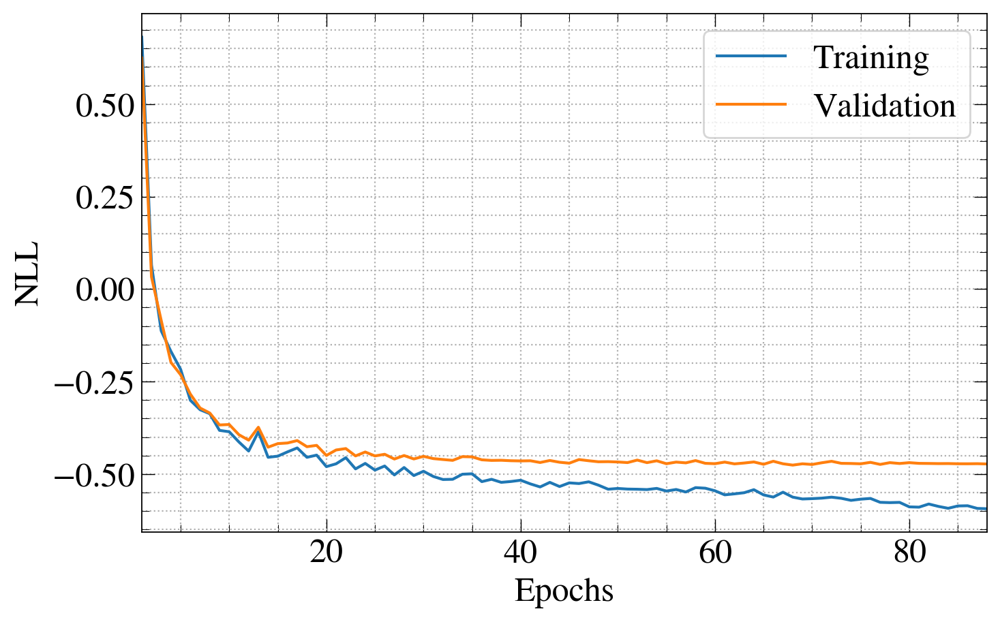

In [61]:
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))

x_values = np.arange(1, len(baseline_results["metadata"]["train_loss"]) + 1)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["train_loss"],
    label="Training",
)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["val_loss"],
    label="Validation",
)

_ = plt.xlim(x_values.min(), x_values.max())
_ = plt.grid(which="both", linestyle=":")
_ = plt.legend()
_ = plt.xlabel("Epochs")
_ = plt.ylabel("NLL")

In [62]:
# baseline_dir = "nas_baseline_regression_gedi"
weights_path = os.path.join(baseline_dir, "models",  "model_0.0.pt")
parameters = problem.default_configuration
torch_module = create_model(parameters, y_mu, y_std)
# torch_module = create_model(parameters)
torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
torch_module.eval()

y_pred_autodeuq = torch_module.forward(X_test_tensor)
y_pred_mean_autodeuq = to_numpy(y_pred_autodeuq.loc)
y_pred_mean_autodeuq = scaler_y.inverse_transform(y_pred_mean_autodeuq)
y_pred_std_autodeuq = to_numpy(y_pred_autodeuq.scale)
y_pred_std_autodeuq = scaler_y.inverse_transform(y_pred_std_autodeuq)
y_pred_mean_autodeuq, y_pred_std_autodeuq

(array([[1.1464506],
        [1.0651587],
        [1.2736169],
        ...,
        [5.8330894],
        [1.2614653],
        [9.500964 ]], dtype=float32),
 array([[2.2205913],
        [2.2040823],
        [2.3231037],
        ...,
        [3.4172647],
        [2.2417185],
        [3.639698 ]], dtype=float32))

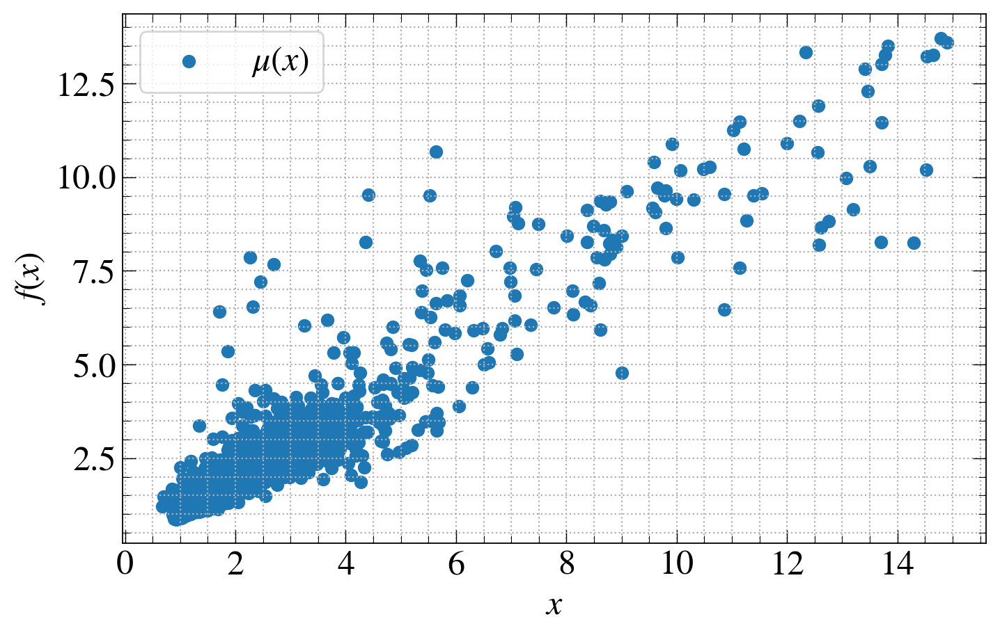

In [63]:
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))
_ = plt.scatter(y_test_copy, y_pred_mean_autodeuq, label=r"$\mu(x)$")
# kappa = 1.96
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

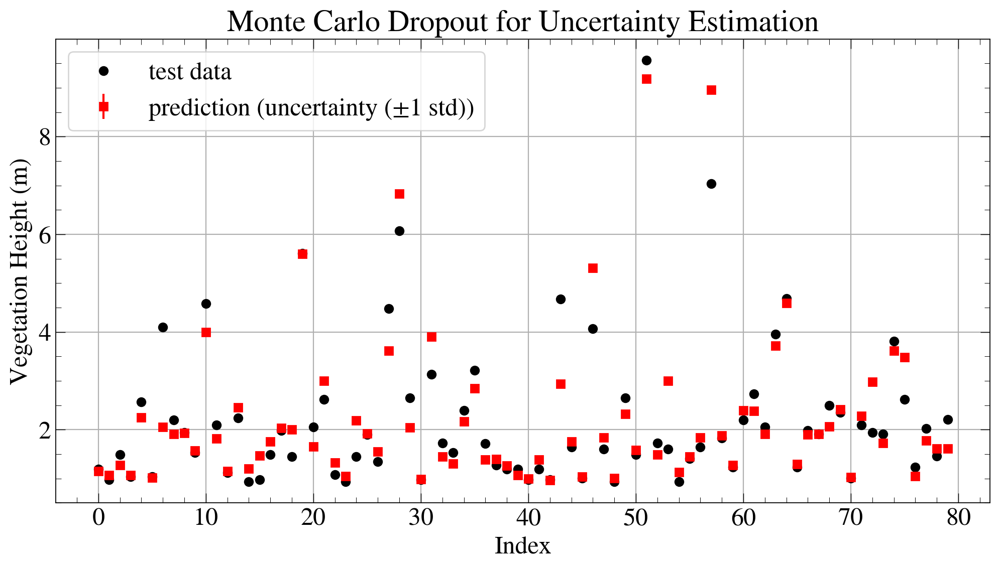

In [64]:
plt.figure(figsize=(12,6))
k = 80
kappa = 1
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_mean_autodeuq.reshape(-1)[:k], 
             yerr = 0, 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Monte Carlo Dropout for Uncertainty Estimation")
plt.show()

### Neural Architecture Search (NAS) With Bayesian Opimization (BO, a.k.a., Efficient Global Optimization (EGO))

#### Parallel Bayesian Optimization
In DeepHyper, instead of just performing sequential Bayesian optimization we provide asynchronous parallelisation for Bayesian optimization (and other methods). This allows to execute multiple evaluation function in parallel to collect observations of objectives faster. In this code, we will focus on using centralized Bayesian optimization (CBO). In this setting, we have one main process that runs the Bayesian optimization algorithm and we have multiple worker processes that run evaluation functions. 


In [65]:
search_kwargs = {
    "initial_points": [problem.default_configuration],
    "multi_point_strategy": "qUCBd",  # Multi-point strategy for asynchronous batch generations (explained later)
    "acq_optimizer": "mixedga",  # Use continuous Genetic Algorithm for the acquisition function optimizer
    "random_state": 0,  # Random seed
}

In [66]:
from deephyper.evaluator import Evaluator
from deephyper.evaluator.callback import TqdmCallback
from deephyper.hpo import CBO
from deephyper.stopper import MedianStopper

hpo_dir = "nas_regression_gedi_final2"

def run_neural_architecture_search(problem, max_evals):
    model_checkpoint_dir = os.path.join(hpo_dir, "models")
    pathlib.Path(model_checkpoint_dir).mkdir(parents=True, exist_ok=True)

    method_kwargs = {
        "run_function_kwargs": {
            "model_checkpoint_dir": model_checkpoint_dir,
            "verbose": False,
        },
        "callbacks": [TqdmCallback()],
    }

    if device == "cuda":
        method_kwargs.update({
            "num_cpus": device_count,
            "num_gpus": device_count,
            "num_cpus_per_task": 1,
            "num_gpus_per_task": 1,
        })
    else:
        method_kwargs.update({
            "num_cpus": device_count,
            "num_cpus_per_task": 1,
        })


    evaluator = Evaluator.create(
        run,
        method="ray",
        method_kwargs=method_kwargs,
    )

    # stopper = None

    # Uncomment the following to speed-up the search
    stopper = MedianStopper(min_steps=50, max_steps=max_n_epochs, interval_steps=50)

    search = CBO(problem, evaluator, log_dir=hpo_dir, stopper=stopper, **search_kwargs)

    results = search.search(max_evals=max_evals)

    return results

In [67]:
max_evals = 250
# max_evals = 50

hpo_results = None
hpo_results_path = os.path.join(hpo_dir, "results.csv")

# # Check and delete if directory path exists
# hpo_results_path2 = os.path.join(os.getcwd(), hpo_dir)
# if os.path.isdir(hpo_results_path2):
#     shutil.rmtree(hpo_results_path2)
#     print(f"Deleted directory: {hpo_results_path2}")
# else:
#     print("Directory does not exist")
#     pass

if os.path.exists(hpo_results_path):
    print("Reloading results...")
    hpo_results = pd.read_csv(hpo_results_path)

if hpo_results is None or len(hpo_results) < max_evals:
    print("Running neural architecture search...")
    hpo_results = run_neural_architecture_search(problem, max_evals)
    
print("Done!!!")

Running neural architecture search...


2025-10-15 23:28:25,804	ERROR services.py:1351 -- Failed to start the dashboard 
2025-10-15 23:28:25,814	ERROR services.py:1376 -- Error should be written to 'dashboard.log' or 'dashboard.err'. We are printing the last 20 lines for you. See 'https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#logging-directory-structure' to find where the log file is.
2025-10-15 23:28:25,827	ERROR services.py:1420 -- 
The last 20 lines of /tmp/ray/session_2025-10-15_23-27-53_616024_128164/logs/dashboard.log (it contains the error message from the dashboard): 
2025-10-15 23:28:17,412	INFO head.py:234 -- Starting dashboard metrics server on port 44227
2025-10-15 23:28:17,448	INFO utils.py:314 -- Get all modules by type: DashboardHeadModule

2025-10-15 23:28:26,396	INFO worker.py:1852 -- Started a local Ray instance.


  0%|          | 0/250 [00:00<?, ?it/s]

Done!!!


### Analysis of the Results

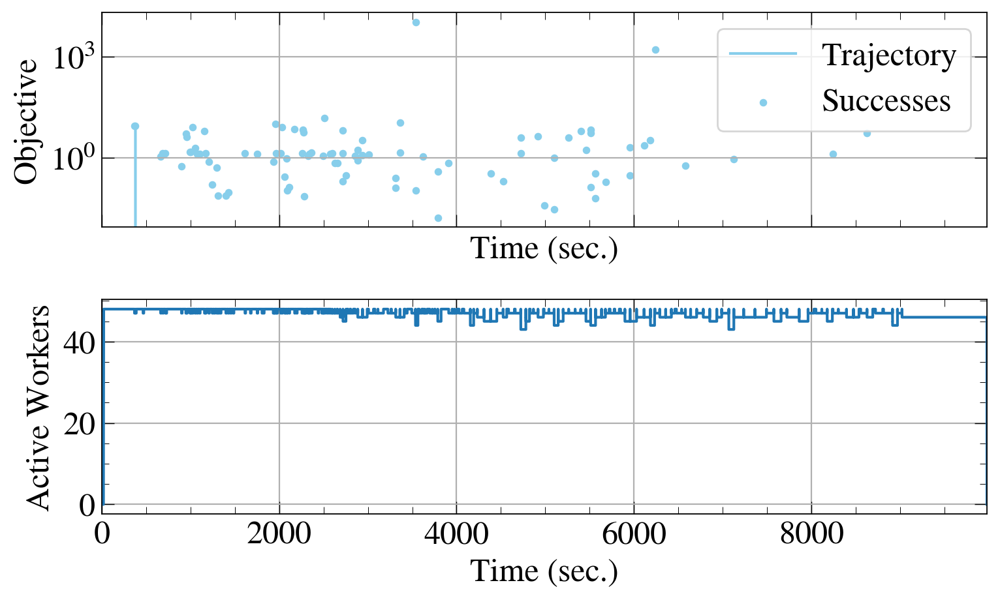

In [68]:
from deephyper.analysis.hpo import plot_search_trajectory_single_objective_hpo
from deephyper.analysis.hpo import plot_worker_utilization

fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    sharex=True,
    figsize=(WIDTH_PLOTS, HEIGHT_PLOTS),
    # figsize=(12, 8),
)

_ = plot_search_trajectory_single_objective_hpo(
    hpo_results,
    mode="min",
    x_units="seconds",
    ax=axes[0],
)
axes[0].set_yscale("log")

_ = plot_worker_utilization(
    hpo_results,
    profile_type="submit/gather",
    ax=axes[1],
)

plt.tight_layout()

Then, we split results between successful and failed results if there are some.

In [69]:
from deephyper.analysis.hpo import filter_failed_objectives

hpo_results, hpo_results_failed = filter_failed_objectives(hpo_results)

hpo_results

,p:batch_size,p:layer_0_activation,p:layer_0_dropout_rate,p:layer_0_units,p:layer_1_activation,p:layer_1_dropout_rate,p:layer_1_units,p:layer_2_activation,p:layer_2_dropout_rate,p:layer_2_units,p:learning_rate,p:lr_scheduler_factor,p:lr_scheduler_patience,p:n_units_mean,p:n_units_std,p:num_layers,p:softplus_factor,p:std_offset,p:layer_3_activation,p:layer_3_dropout_rate,p:layer_3_units,p:layer_4_activation,p:layer_4_dropout_rate,p:layer_4_units,p:layer_5_activation,p:layer_5_dropout_rate,p:layer_5_units,p:layer_6_activation,p:layer_6_dropout_rate,p:layer_6_units,p:layer_7_activation,p:layer_7_dropout_rate,p:layer_7_units,objective,job_id,job_status,m:timestamp_submit,m:train_loss,m:val_loss,m:train_mse,m:val_mse,m:test_loss,m:test_mse,m:budget,m:timestamp_gather
0,556,sigmoid,0.070872,374,leaky_relu,0.009983,244,swish,0.342186,85,0.065124,0.779446,19,171,329,3,3.913446,0.009953,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,-9.138262,18,DONE,20.561943,"[101876400.0, 9.200629, 278.98996, 1009.7601, ...","[97111910.0, 9.2358, 9.184748, 9.135923, 9.090...","[21706.377, 3055.204, 2623.541, 1112.1572, 846...","[20684.443, 2724.5667, 2294.2131, 818.45544, 6...",9.138980,36.815900,31,369.733514
1,643,tanh,0.145314,122,swish,0.429953,217,gelu,0.256545,456,0.056009,0.579360,11,92,494,3,6.598181,0.006933,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,-9.098337,30,DONE,21.584715,"[5999045.0, 1236.1322, 1063.4327, 971.1972, 35...","[5804514.5, 842.28485, 1423.2249, 1297.6045, 1...","[1304.2345, 56.167614, 52.26574, 49.43893, 48....","[1183.074, 44.590534, 40.634014, 39.199345, 39...",9.143907,42.199467,32,380.068029
2,1409,relu,0.495583,190,tanh,0.325708,155,gelu,0.213269,397,0.007526,0.949671,16,195,405,4,3.697867,0.077593,leaky_relu,0.411495,106,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,0.096641,17,DONE,20.483830,"[1.2187804, 0.8816451, 0.63593036, 0.34319398,...","[1.0328516, 0.7332234, 0.49522358, 0.17460299,...","[0.77390045, 0.50483805, 0.40093368, 0.2647816...","[0.67569894, 0.41033655, 0.34301403, 0.2441546...",-0.029753,0.168027,37,466.243407
3,491,gelu,0.217629,321,gelu,0.227061,335,silu,0.095535,157,0.000021,0.410170,5,435,365,3,4.296561,0.000092,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,-1.104705,10,DONE,19.954479,"[1.4868388, 1.4275223, 1.4013653, 1.3797247, 1...","[1.4234394, 1.385231, 1.3615412, 1.3447629, 1....","[1.0178572, 1.0124007, 1.0042256, 1.0044556, 1...","[0.92403454, 0.92238235, 0.92125577, 0.9203127...",1.141363,1.023844,50,664.500481
4,223,leaky_relu,0.363204,68,sigmoid,0.091150,405,sigmoid,0.047795,509,0.048904,0.895201,12,123,410,6,7.465993,0.000321,leaky_relu,0.306350,167,relu,0.050414,124,swish,0.000640,129,relu,0.000000,64,relu,0.0,64,-1.388866,45,DONE,22.657733,"[549018750.0, 1.5205452, 1.4961088, 1.4884526,...","[527869200.0, 1.3852233, 1.386936, 1.3894577, ...","[194.1384, 1.0270727, 1.0338475, 1.0292469, 1....","[188.04866, 0.93142927, 0.9314294, 0.9314295, ...",1.452800,1.068548,22,687.090724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291,490,silu,0.093658,421,leaky_relu,0.213163,494,sigmoid,0.160139,138,0.001110,0.081816,7,306,180,3,7.606439,0.002637,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,0.219829,292,DONE,8969.567595,"[0.95141125, 0.4013611, 0.22271538, 0.1223406,...","[0.79534787, 0.2580921, 0.08285098, -0.0298607...","[1.0413479, 0.8764386, 0.72656226, 0.61529, 0....","[0.9459453, 0.7769386, 0.63543516, 0.5411506, ...",-0.165305,0.436300,29,9978.027859
292,598,swish,0.217355,283,sigmoid,0.336717,471,relu,0.116469,461,0.001626,0.051662,19,481,196,4,3.065205,0.027494,mish,0.221801,403,relu,0.000000,64,relu,0.000000,64,relu,0.000000,64,relu,0.0,64,0.261909,267,DONE,7657.640598,"[1.3490721, 0.7021354

In [70]:
hpo_results_failed

,p:batch_size,p:layer_0_activation,p:layer_0_dropout_rate,p:layer_0_units,p:layer_1_activation,p:layer_1_dropout_rate,p:layer_1_units,p:layer_2_activation,p:layer_2_dropout_rate,p:layer_2_units,p:learning_rate,p:lr_scheduler_factor,p:lr_scheduler_patience,p:n_units_mean,p:n_units_std,p:num_layers,p:softplus_factor,p:std_offset,p:layer_3_activation,p:layer_3_dropout_rate,p:layer_3_units,p:layer_4_activation,p:layer_4_dropout_rate,p:layer_4_units,p:layer_5_activation,p:layer_5_dropout_rate,p:layer_5_units,p:layer_6_activation,p:layer_6_dropout_rate,p:layer_6_units,p:layer_7_activation,p:layer_7_dropout_rate,p:layer_7_units,objective,job_id,job_status,m:timestamp_submit,m:train_loss,m:val_loss,m:train_mse,m:val_mse,m:test_loss,m:test_mse,m:budget,m:timestamp_gather


We look at the learning curves of the best model and observe improvements in both training and validation loss:

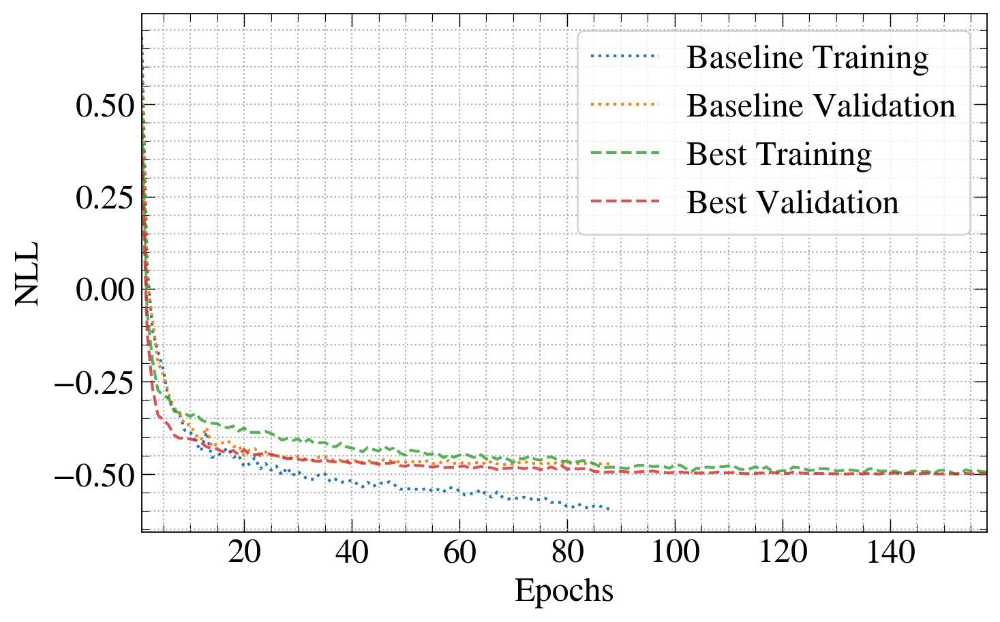

In [71]:
# Make learning curves plot
x_values = np.arange(1, len(baseline_results["metadata"]["train_loss"]) + 1)
x_min, x_max = x_values.min(), x_values.max()
_ = plt.figure(figsize=(WIDTH_PLOTS, HEIGHT_PLOTS))
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["train_loss"],
    linestyle=":",
    label="Baseline Training",
)
_ = plt.plot(
    x_values,
    baseline_results["metadata"]["val_loss"],
    linestyle=":",
    label="Baseline Validation",
)

i_max = hpo_results["objective"].argmax()
train_loss = json.loads(hpo_results.iloc[i_max]["m:train_loss"])
val_loss = json.loads(hpo_results.iloc[i_max]["m:val_loss"])
x_values = np.arange(1, len(train_loss) + 1)
x_max = max(x_max, x_values.max())
_ = plt.plot(
    x_values,
    train_loss,
    alpha=0.8,
    linestyle="--",
    label="Best Training",
)
_ = plt.plot(
    x_values,
    val_loss,
    alpha=0.8,
    linestyle="--",
    label="Best Validation",
)
_ = plt.xlim(x_min, x_max)
_ = plt.grid(which="both", linestyle=":")
_ = plt.legend()
_ = plt.xlabel("Epochs")
_ = plt.ylabel("NLL")

Finally, we look at predictions of this best model and observe that it manage to predict much better than the baseline one the right range.

In [72]:
from deephyper.analysis.hpo import parameters_from_row

# hpo_dir = "nas_regression_gedi"
model_checkpoint_dir = os.path.join(hpo_dir, "models")
job_id = hpo_results.iloc[i_max]["job_id"]
file_name = f"model_0.{job_id}.pt"

weights_path = os.path.join(model_checkpoint_dir, file_name)
parameters = parameters_from_row(hpo_results.iloc[i_max])

torch_module = create_model(parameters, y_mu, y_std)

torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
torch_module.eval()

# y_pred_best_autodeuq = torch_module.forward(X_train_tensor)
y_pred_best_autodeuq = torch_module.forward(X_test_tensor)
y_pred_mean_best_autodeuq = to_numpy(y_pred_best_autodeuq.loc)
y_pred_mean_best_autodeuq = scaler_y.inverse_transform(y_pred_mean_best_autodeuq)
y_pred_std_best_autodeuq = to_numpy(y_pred_best_autodeuq.scale)
y_pred_std_best_autodeuq = scaler_y.inverse_transform(y_pred_std_best_autodeuq)
y_pred_mean_best_autodeuq

array([[1.1414969],
       [1.0922805],
       [1.3049837],
       ...,
       [5.8264427],
       [1.2398998],
       [9.78519  ]], dtype=float32)

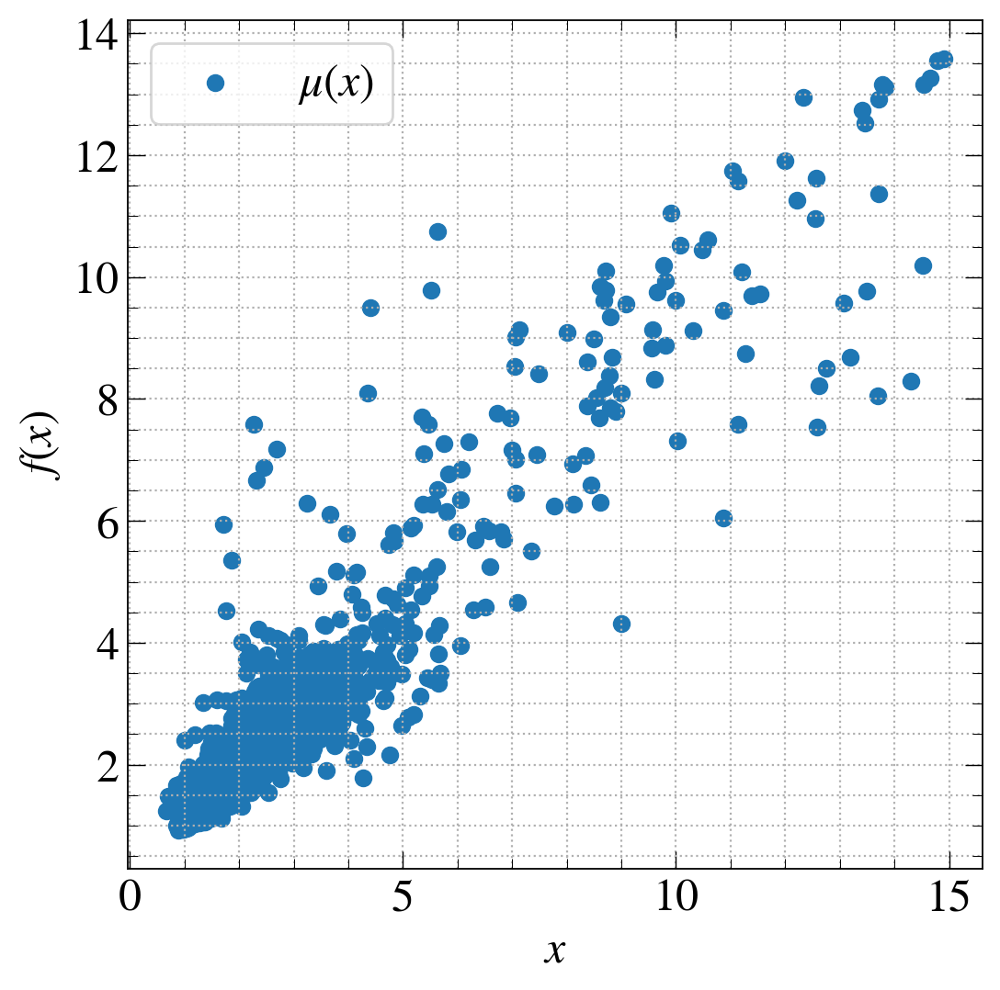

In [73]:
kappa = 1.96
_ = plt.scatter(y_test_copy, y_pred_mean_best_autodeuq, label=r"$\mu(x)$")
# _ = plt.fill_between(
#     test_X.reshape(-1),
#     (y_pred_mean - kappa * y_pred_std).reshape(-1),
#     (y_pred_mean + kappa * y_pred_std).reshape(-1),
#     alpha=0.25,
#     label=r"$\sigma_\text{al}(x)$",
# )
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

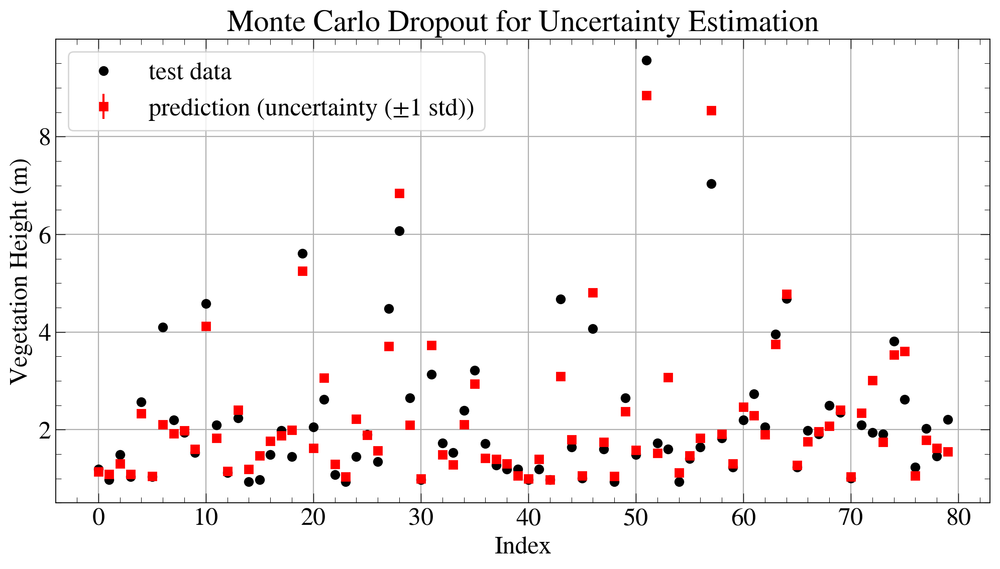

In [74]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
kappa = 1
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
# plt.plot(pred_mean_inv[:50], color="blue", label="MC Dropout Mean", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_mean_best_autodeuq.reshape(-1)[:k], 
             yerr = 0, #y_pred_std.reshape(-1)[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Monte Carlo Dropout for Uncertainty Estimation")
plt.show()

### Deep Ensemble
After running the neural architecture search we have an available library of checkpointed models. Heer, we combine these models to form an ensemble that can improve both accuracy and provide disentangled uncertainty quantification.

In [75]:
from deephyper.ensemble import EnsemblePredictor
from deephyper.ensemble.aggregator import MixedNormalAggregator, MeanAggregator
from deephyper.ensemble.loss import NormalNegLogLikelihood
from deephyper.ensemble.selector import GreedySelector, TopKSelector
from deephyper.predictor.torch import TorchPredictor

class NormalTorchPredictor(TorchPredictor):
    def __init__(self, torch_module):
        super().__init__(torch_module.to(device=device, dtype=dtype))

    def pre_process_inputs(self, X):
        return to_torch(X)

    def post_process_predictions(self, y):
        return {
            # "loc": to_numpy(y.loc),
            # "scale": to_numpy(y.scale),
            "loc": scaler_y.inverse_transform(to_numpy(y.loc)),
            "scale": scaler_y.inverse_transform(to_numpy(y.scale)),
        }

After defining the predictor, we load the checkpointed models to collect their predictions into `y_predictors`. These predictions are the inputs of our loss, aggregation and selection functions. We also collect the job ids of the checkpointed models into `job_id_predictors`.

In [76]:
model_checkpoint_dir = os.path.join(hpo_dir, "models")

y_predictors = []
job_id_predictors = []

for file_name in tqdm(os.listdir(model_checkpoint_dir)):
    if not file_name.endswith(".pt"):
        continue

    weights_path = os.path.join(model_checkpoint_dir, file_name)
    job_id = int(file_name[6:-3].split(".")[-1])

    row = hpo_results[hpo_results["job_id"] == job_id]
    if len(row) == 0:
        continue
    assert len(row) == 1

    row = row.iloc[0]
    parameters = parameters_from_row(row)
    torch_module = create_model(parameters, y_mu, y_std)
    try:
        torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
    except RuntimeError:
        continue
    predictor = NormalTorchPredictor(torch_module)
    y_pred = predictor.predict(np.array(X_val_tensor))
    # y_pred["loc"] = scaler_y.inverse_transform(y_pred["loc"])
    y_predictors.append(y_pred)
    job_id_predictors.append(job_id)
    # print(y_pred)

100%|██████████| 296/296 [00:05<00:00, 50.34it/s]


### Ensemble selection

The top-k selection, selects the topk-k models according to the given `los_func` and weight them equally in the ensemble. The greedy selection, iteratively selects models from the checkpoints that improves the current ensemble.

In [77]:
k1 = 30
k2 = 30

# # Top-K Selection
# selector = TopKSelector(
#     loss_func=NormalNegLogLikelihood(),
#     k=k1,
# )

# Greedy Selection
selector = GreedySelector(
    loss_func=NormalNegLogLikelihood(),
    aggregator=MixedNormalAggregator(),
    # aggregator=MeanAggregator(),
    k=k1,
    max_it=k2,
    k_init=1,
    # early_stopping=True,
    early_stopping=False,
    # with_replacement=True,
    with_replacement=False,
    bagging=True,
    verbose=True,
)

selected_predictors_indexes, selected_predictors_weights = selector.select(
    np.array(y_val_tensor),
    y_predictors,
)

print(f"{selected_predictors_indexes=}")
print(f"{selected_predictors_weights=}")

selected_predictors_job_ids = np.array(job_id_predictors)[selected_predictors_indexes]
selected_predictors_job_ids

print(f"{selected_predictors_job_ids=}")
print("DONE!!!")

Ensemble initialized with [164] with loss [2.1132245517869217]
Step 1, ensemble is [164, 200], new member 200 with loss 2.133836321282284
Step 2, ensemble is [164, 200, 22], new member 22 with loss 2.141271029918645
Step 3, ensemble is [164, 200, 22, 35], new member 35 with loss 2.1459642197463538
Step 4, ensemble is [164, 200, 22, 35, 184], new member 184 with loss 2.1493684712599648
Step 5, ensemble is [164, 200, 22, 35, 184, 27], new member 27 with loss 2.152001758821953
Step 6, ensemble is [164, 200, 22, 35, 184, 27, 99], new member 99 with loss 2.1535668384193705
Step 7, ensemble is [164, 200, 22, 35, 184, 27, 99, 83], new member 83 with loss 2.1553908586600934
Step 8, ensemble is [164, 200, 22, 35, 184, 27, 99, 83, 70], new member 70 with loss 2.156498014374923
Step 9, ensemble is [164, 200, 22, 35, 184, 27, 99, 83, 70, 66], new member 66 with loss 2.1578743822367166
Step 10, ensemble is [164, 200, 22, 35, 184, 27, 99, 83, 70, 66, 151], new member 151 with loss 2.1589931127657165

### Evaluation of the ensemble

In [78]:
ensemble_members = []

# hpo_dir = "nas_regression_gedi"
model_checkpoint_dir = os.path.join(hpo_dir, "models")

for job_id in selected_predictors_job_ids:
    file_name = f"model_0.{job_id}.pt"

    weights_path = os.path.join(model_checkpoint_dir, file_name)

    row = hpo_results[hpo_results["job_id"] == job_id].iloc[0]
    parameters = parameters_from_row(row)
    torch_module = create_model(parameters, y_mu, y_std)
    torch_module.load_state_dict(torch.load(weights_path, weights_only=True))
    ensemble_member = NormalTorchPredictor(torch_module)
    ensemble_members.append(ensemble_member)

ensemble_autodeuq = EnsemblePredictor(
    predictors=ensemble_members,
    weights=selected_predictors_weights,
    # weights=None,
    aggregator=MixedNormalAggregator(decomposed_scale=True),
    # aggregator=MeanAggregator(decomposed_scale=True),
)

y_pred_ensemble_autodeuq = ensemble_autodeuq.predict(np.array(X_test_tensor))
y_pred_ensemble_autodeuq#["loc"]

{'loc': array([[1.17780887],
        [1.12942051],
        [1.27714574],
        ...,
        [5.23552005],
        [1.25820014],
        [8.23330739]]),
 'scale_aleatoric': array([[2.28443954],
        [2.27242508],
        [2.34538847],
        ...,
        [4.21432763],
        [2.3068224 ],
        [5.34773624]]),
 'scale_epistemic': array([[0.11309886],
        [0.11572591],
        [0.0563929 ],
        ...,
        [1.2503954 ],
        [0.07508226],
        [2.410614  ]], dtype=float32)}

In [79]:
# import ray
# from deephyper.ensemble import UQBaggingEnsembleRegressor

# if not (ray.is_initialized()):
#     ray.init(num_cpus=1, num_gpus=1 if is_gpu_available else None)

# ensemble = UQBaggingEnsembleRegressor(
#     model_dir="agebo-results/save/model",
#     loss=nll,  # default is nll
#     size=5,
#     verbose=True,
#     ray_address="auto",
#     num_cpus=1,
#     num_gpus=1 if is_gpu_available else None,
#     selection="caruana",
# )

# ensemble.fit(X_valid, y_valid)

# print(f"Selected {len(ensemble.members_files)} members are: ", ensemble.members_files)


In [80]:
# def ensemble_predict(X, kappa=1.96):
#     y_pred_dist, var_aleatoric, var_epistemic = ensemble.predict_var_decomposition(X)

#     mu = y_pred_dist.loc.numpy()
#     std_aleatoric = np.sqrt(var_aleatoric)
#     std_epistemic = np.sqrt(var_epistemic)

#     mu_ci_aleatoric = mu + kappa * std_aleatoric
#     mu_ci_epistemic = mu + kappa * std_epistemic
#     mu_full = inverse_transform(mu)
#     mu_ci_aleatoric = inverse_transform(mu_ci_aleatoric)
#     mu_ci_epistemic = inverse_transform(mu_ci_epistemic)
#     uq_aleatoric = np.abs(mu_full - mu_ci_aleatoric)
#     uq_epistemic = np.abs(mu_full - mu_ci_epistemic)

#     return mu_full, uq_aleatoric, uq_epistemic

In [81]:
print(len(ensemble_members))
selected_predictors_job_ids

30


array([164,  48, 134, 238, 243, 175,  69, 268, 133, 285, 278, 225,  58,
       169, 132, 246, 210,   0,  61, 284, 213, 211, 234,  55, 179, 290,
       226,  26,  90, 265])

In [82]:
y_predictors_test = []
for model in ensemble_members:
    model_pred_y = model.predict(np.array(X_test_tensor))
    y_predictors_test.append(model_pred_y)
# y_predictors_test

In [83]:
y_predictors_test[0]

{'loc': array([[1.1705997],
        [1.1107664],
        [1.3167474],
        ...,
        [4.7087154],
        [1.2520106],
        [7.738889 ]], dtype=float32),
 'scale': array([[2.2732718],
        [2.2491915],
        [2.3193762],
        ...,
        [3.4543386],
        [2.297691 ],
        [4.4894004]], dtype=float32)}

In [84]:
print([i for i in selected_predictors_job_ids], "\n")
selected_predictors_job_ids2 = np.array(list(selected_predictors_job_ids[1:6]) + list(selected_predictors_job_ids[7:]))
selected_predictors_weights2 = selected_predictors_weights[1:6] + selected_predictors_weights[7:]
print(selected_predictors_job_ids2)
print(selected_predictors_weights2)

[164, 48, 134, 238, 243, 175, 69, 268, 133, 285, 278, 225, 58, 169, 132, 246, 210, 0, 61, 284, 213, 211, 234, 55, 179, 290, 226, 26, 90, 265] 

[ 48 134 238 243 175 268 133 285 278 225  58 169 132 246 210   0  61 284
 213 211 234  55 179 290 226  26  90 265]
[0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333, 0.03333333333333333]


In [85]:
# extract models at the given indices
# selected_dicts = [y_predictors[i] for i in selected_predictors_job_ids2]
selected_dicts = [y_predictors_test[i] for i in range(len(y_predictors_test))]
len(selected_dicts)
# selected_dicts

# 180, 68,

30

In [86]:
# Extract and stack all "loc" values into a single array
loc_values = np.stack([d["loc"].reshape(-1) for d in selected_dicts])  # shape: (n_items, n_values_per_item)
len(loc_values)
loc_values

# Compute mean and standard deviation
elementwise_means = np.mean(loc_values, axis=0)
elementwise_stds = np.std(loc_values, axis=0)

print("Element-wise means:", elementwise_means)
print("Element-wise stds:", elementwise_stds)

Element-wise means: [1.177809  1.1294205 1.2771457 ... 5.23552   1.2582002 8.233308 ]
Element-wise stds: [0.11309886 0.11572591 0.0563929  ... 1.2503954  0.07508226 2.410614  ]


In [87]:
loc_values = [selected_dicts[i]["loc"].reshape(-1) for i in range(len(selected_dicts))]  # shape: (n_items, n_values_per_item)
stacked = np.stack(loc_values)  # Shape: (n_arrays, array_length)
len(stacked[0])

elementwise_means = np.mean(stacked, axis=0)
elementwise_stds = np.std(stacked, axis=0)

print("Length of the element-wise means:", len(elementwise_means))
print("Length of the element-wise std:", len(elementwise_stds))
print("Element-wise means:", elementwise_means)
print("Element-wise stds:", elementwise_stds)

Length of the element-wise means: 2559
Length of the element-wise std: 2559
Element-wise means: [1.177809  1.1294205 1.2771457 ... 5.23552   1.2582002 8.233308 ]
Element-wise stds: [0.11309886 0.11572591 0.0563929  ... 1.2503954  0.07508226 2.410614  ]


In [88]:
len(ensemble_members)

30

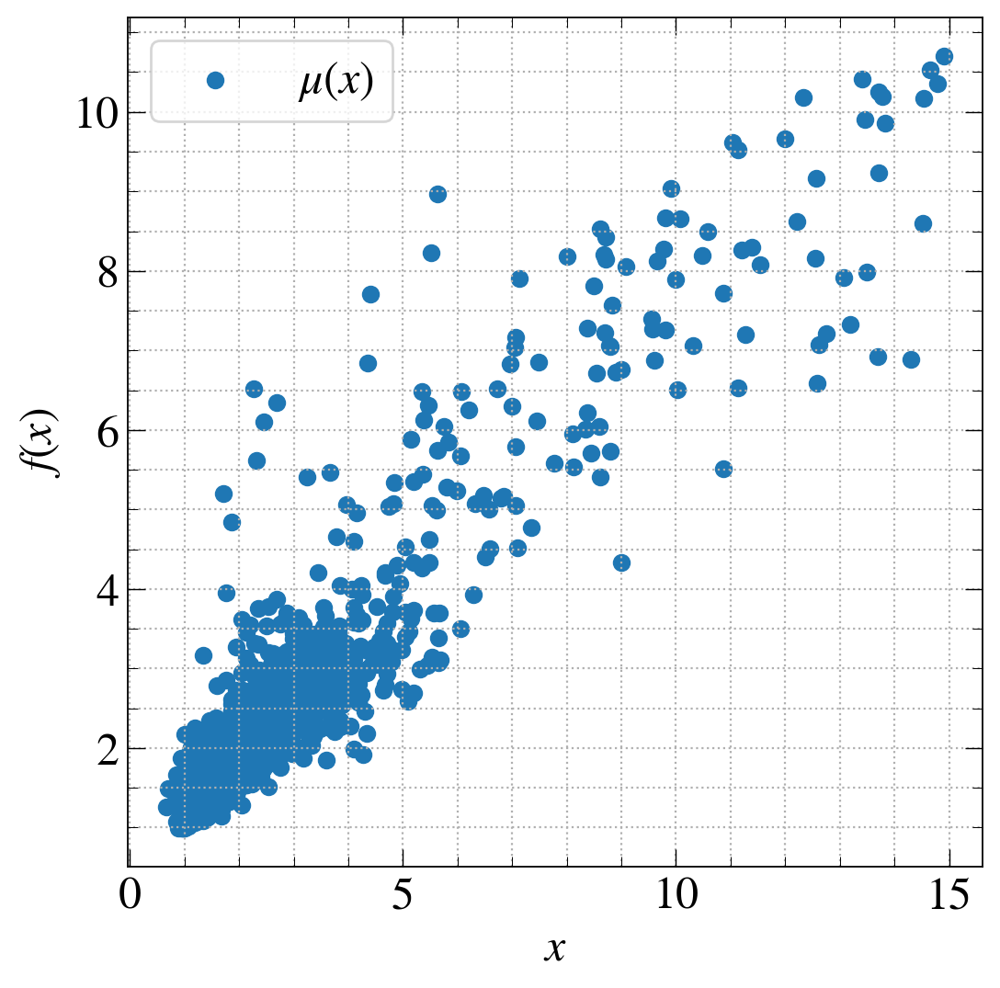

In [89]:
_ = plt.scatter(y_test_copy, y_pred_ensemble_autodeuq["loc"], label=r"$\mu(x)$")
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

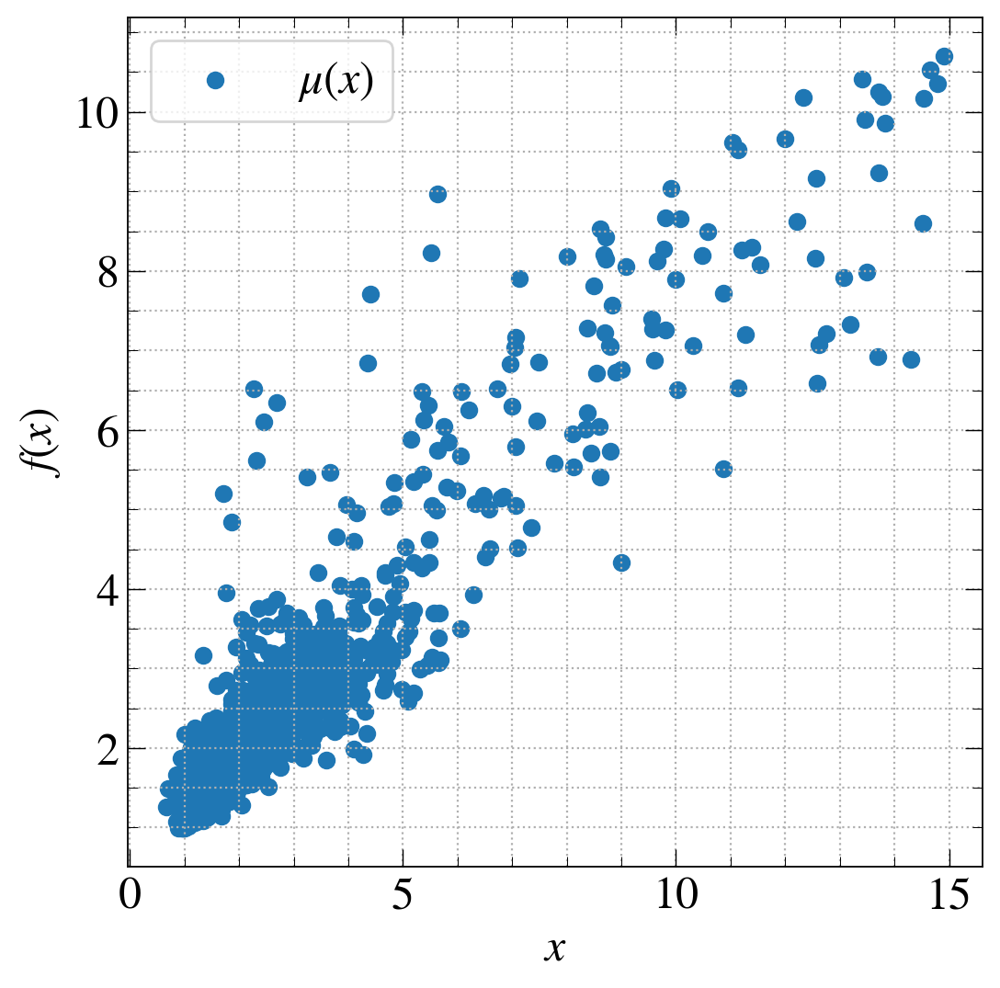

In [90]:
_ = plt.scatter(y_test_copy, elementwise_means, label=r"$\mu(x)$")
_ = plt.legend(ncols=2)
_ = plt.xlabel(r"$x$")
_ = plt.ylabel(r"$f(x)$")
_ = plt.grid(which="both", linestyle=":")

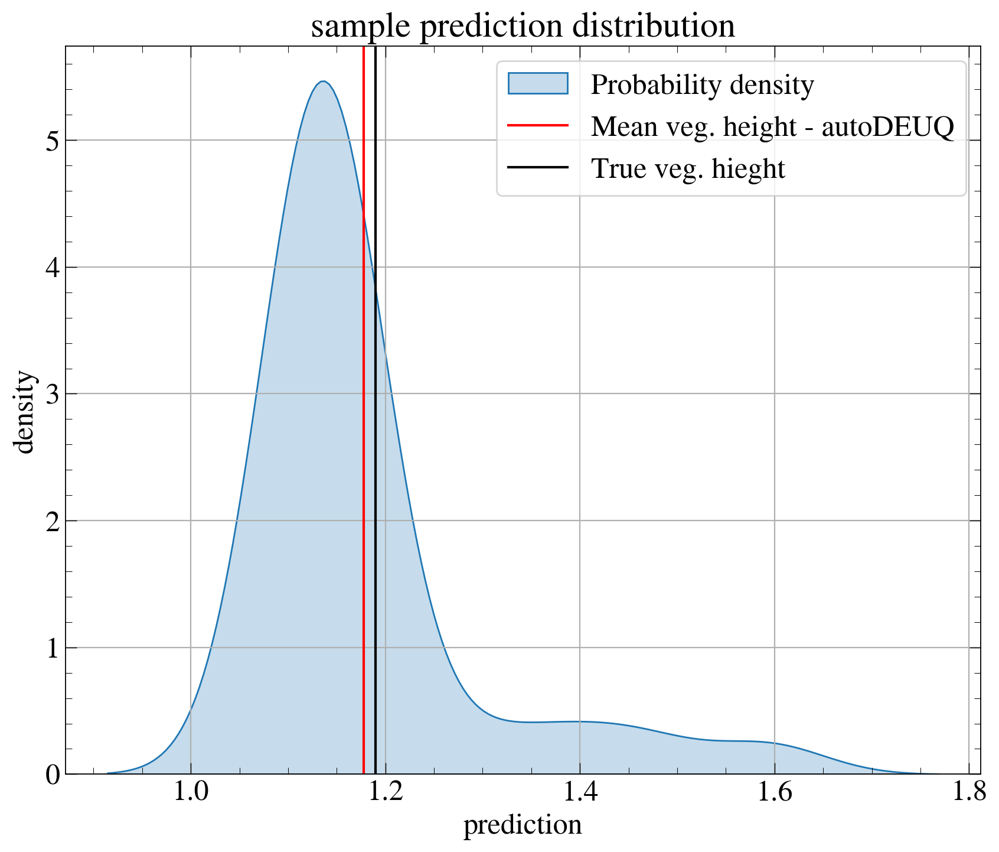

In [91]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(stacked[:,n], shade=True, label = "Probability density")
# plt.axvline(elementwise_means[n], color='red', label = "Mean veg. height - autoDEUQ")
plt.axvline(y_pred_ensemble_autodeuq["loc"].reshape(-1)[n], color='red', label = "Mean veg. height - autoDEUQ")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("sample prediction distribution")
plt.legend()
plt.show()

### Total Uncertainty

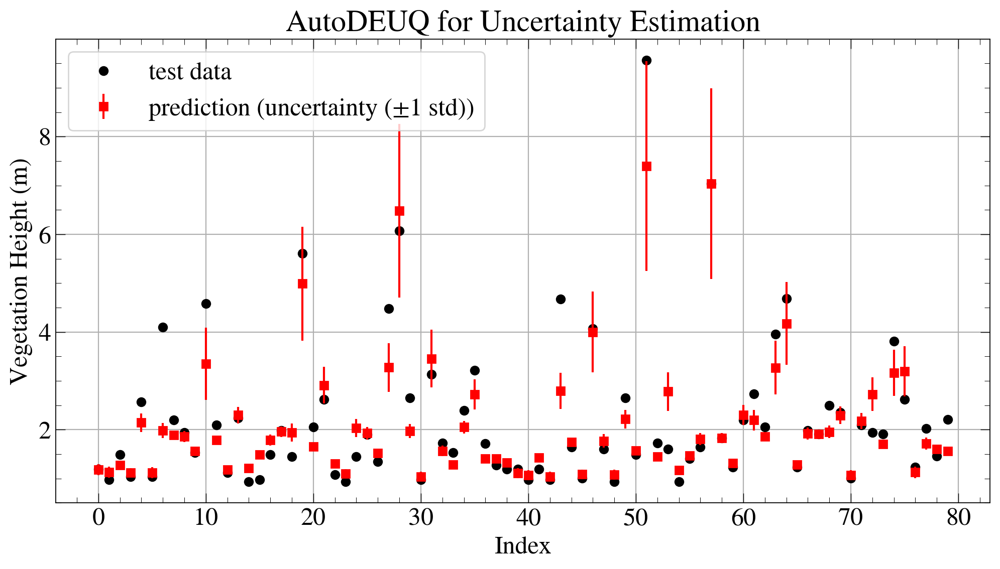

In [92]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
total_uncertainty = y_pred_ensemble_autodeuq["scale_aleatoric"].reshape(-1)+y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")

# plt.errorbar(list(range(k)), 
#              y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
#              yerr = total_uncertainty[:k], 
#              color="red", alpha=1.0, 
#              label="prediction (uncertainty (±1 std))", 
#              linestyle="None", fmt='s')

plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = elementwise_stds[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("AutoDEUQ for Uncertainty Estimation")
plt.show()

### Aleatoric Uncertainty

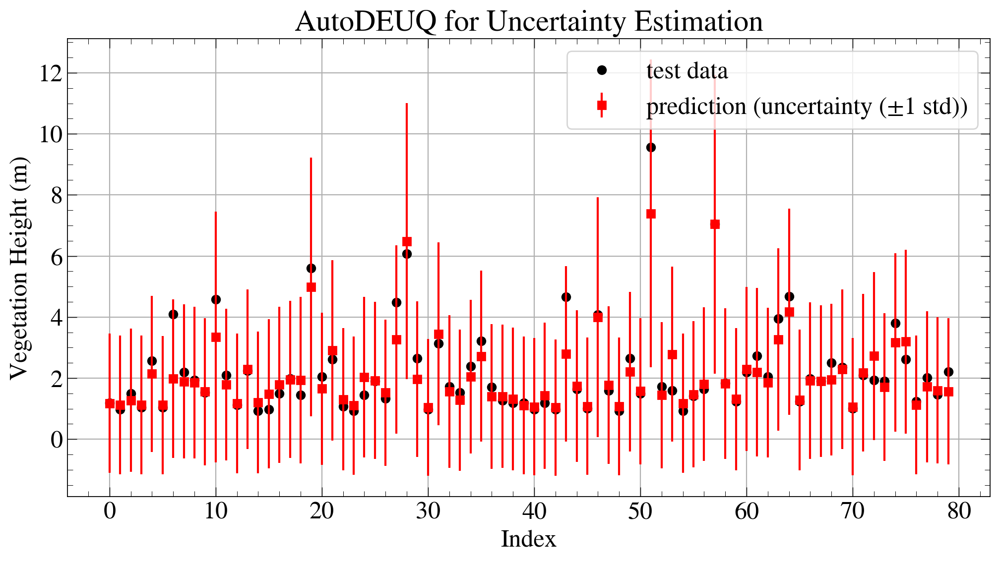

In [93]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = y_pred_ensemble_autodeuq["scale_aleatoric"].reshape(-1)[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("AutoDEUQ for Uncertainty Estimation")
plt.show()

### Epistemic Uncertainty

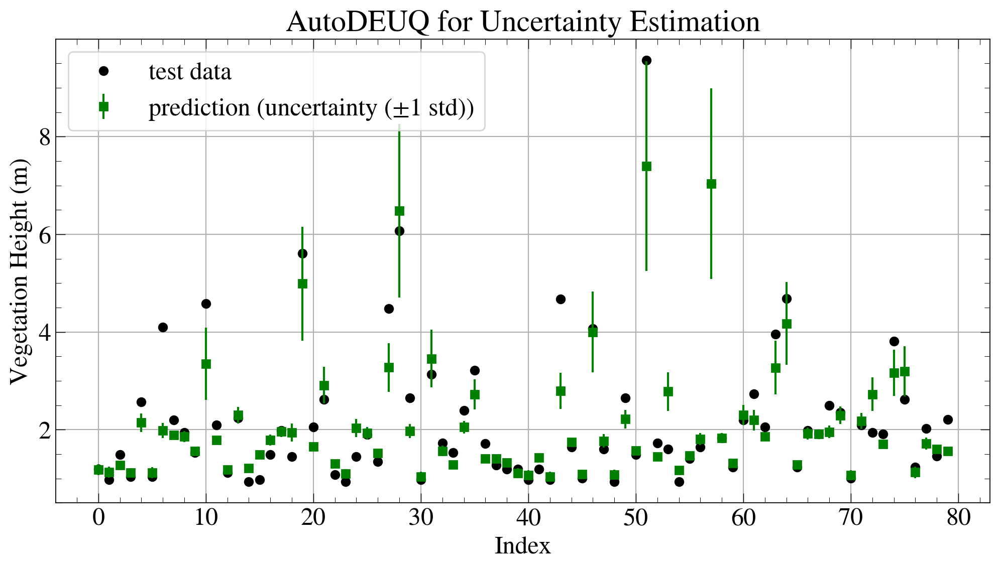

In [94]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k], 
             color="green", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("AutoDEUQ for Uncertainty Estimation")
plt.show()

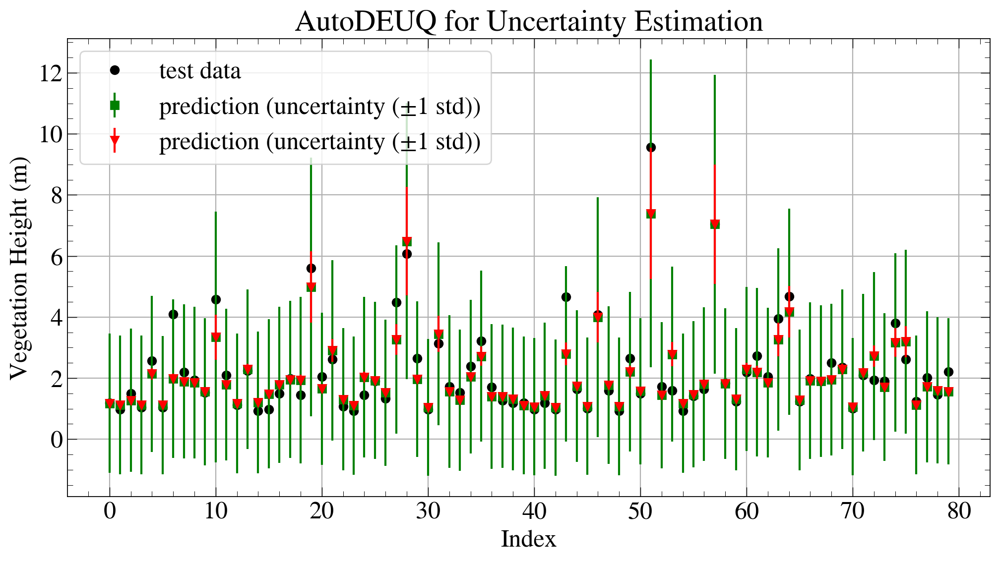

In [95]:
plt.figure(figsize=(12,6))
k = 80
# kappa = 1.96
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = y_pred_ensemble_autodeuq["scale_aleatoric"].reshape(-1)[:k], 
             color="green", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='v')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("AutoDEUQ for Uncertainty Estimation")
plt.show()

In [96]:
cvs_name = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/ml_uncertainties_gedi.csv" #set name of the output #set name of the output
y_pred_ensemble_autodeuq_df = pd.DataFrame(y_pred_ensemble_autodeuq)
y_pred_ensemble_autodeuq_df.to_csv(cvs_name, index=False)

ValueError: Per-column arrays must each be 1-dimensional

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from sliderule import sliderule

# k = 300
k = len(y_test_copy)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.25)
plt.show()

## The Random Forest Model

In [ ]:
import torch
import numpy as np
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# # Example Data
# input_dim = 13  # Example input dimension (number of features)
# output_dim = 1   # For regression, output is typically a single continuous value
# batch_size = 50  # Batch size (not used here, as RandomForest does not use mini-batches)

# Define the model (RandomForestRegressor)
rf_model = RandomForestRegressor(n_estimators=100,  # Number of trees in the forest 
                                 max_depth=5,       # Maximum depth of each tree 
                                 random_state=42,   # Setting seed
                                 bootstrap=True     # Bootstrapping for randomness
)

# KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

# Initialize lists to store the average losses for each fold
train_losses = []
val_losses = []

# Perform KFold Cross-Validation
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_0)):
    print(f"Training Fold {fold+1}")
    # Create train and validation subsets using the indices
    X_train, X_val = X_train_0.values[train_idx], X_train_0.values[val_idx]
    y_train, y_val = y_train_0[train_idx], y_train_0[val_idx]

    # Train the model on the training data
    rf_model.fit(X_train, y_train.ravel())  # .ravel() to convert y to a 1D array

    # Predict on the training and validation data
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    # Calculate MSE for both training and validation
    train_loss = mean_squared_error(y_train, y_train_pred)
    val_loss = mean_squared_error(y_val, y_val_pred)

    # Store the losses
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Fold {fold+1} - Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

# Plotting the train and validation loss across all folds
plt.figure(figsize=(10, 6))
plt.ylim(0,1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Train vs Validation Loss Across Folds")
plt.xlabel("Folds")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Final average losses across all folds
avg_train_loss = np.mean(train_losses)
avg_val_loss = np.mean(val_losses)

print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Validation Loss: {avg_val_loss:.4f}")

In [ ]:
# Get predictions from all individual trees
all_tree_preds_rf = np.stack([tree.predict(X_test_copy) for tree in rf_model.estimators_])

# Compute mean and std across all trees
y_pred_mean_rf = []
y_pred_std_rf = []
# Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
for i in range(all_tree_preds_rf.shape[1]):
    pred_avg_rf = np.mean(all_tree_preds_rf[:,i].reshape(-1, 1))
    y_pred_mean_rf.append(float(pred_avg_rf))    
    
    pred_sd_rf = np.std(all_tree_preds_rf[:,i].reshape(-1, 1))
    y_pred_std_rf.append(float(pred_sd_rf))
    
#     pred_avg_rf = np.mean(scaler_y.inverse_transform(all_tree_preds_rf[:,i].reshape(-1, 1)))
#     y_pred_mean_rf.append(float(pred_avg_rf))    
    
#     pred_sd_rf = np.std(scaler_y.inverse_transform(all_tree_preds_rf[:,i].reshape(-1, 1)))
#     y_pred_std_rf.append(float(pred_sd_rf))
    
display(np.array(y_pred_mean_rf))
display(np.array(y_pred_std_rf))
y_test_copy

In [ ]:
plt.figure(figsize=(10,8))
n = 0
sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), shade=True, label = "Probability density")
plt.axvline(y_pred_mean_rf[n], color='red', label = "Mean veg. height - RF")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("sample prediction distribution")
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[:k], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[:k], 
             yerr = y_pred_std_rf[:k], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Random Forest Regression for Uncertainty Estimation")
plt.show()

In [ ]:
plt.figure(figsize=(12,6))
k = 80
plt.plot(y_test_copy[-k:], color="black", label="test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[-k:], 
             yerr = y_pred_std_rf[-k:], 
             color="red", alpha=1.0, 
             label="prediction (uncertainty (±1 std))", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
plt.title("Random Forest Regression for Uncertainty Estimation")
plt.show()

#### Overlay Predictions on Map

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from sliderule import sliderule

# k = 300
k = len(y_test_copy)
fig, ax = plt.subplots(1, 3, figsize=(18, 14), sharey=True)  # 1 row, 3 columns

# Plot the first scatter plot on the first axis (ax[0])
scatter1 = ax[0].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=y_test_copy[:k], cmap="viridis", s=40, alpha=1.0, label="Test data")
ax[0].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar1 = plt.colorbar(scatter1, ax=ax[0], orientation="horizontal")
cbar1.set_label("Vegetation Height")
ax[0].set_title("True Values")
ax[0].legend()

# Plot the second scatter plot on the second axis (ax[1])
scatter2 = ax[1].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(y_pred_mean_rf)[:k], cmap="viridis", s=40, alpha=1.0, label="Predicted mean")
ax[1].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar2 = plt.colorbar(scatter2, ax=ax[1], orientation="horizontal")
cbar2.set_label("Vegetation Height")
ax[1].set_title("Predicted Mean")
ax[1].legend()

# Plot the third scatter plot on the third axis (ax[2])
scatter3 = ax[2].scatter(X_test_copy[:, 4][:k], X_test_copy[:, 5][:k],
                          c=np.array(y_pred_std_rf)[:k], cmap="viridis", s=40, alpha=1.0, label="Prediction uncertainty")
ax[2].plot(region_lon, region_lat, linewidth=2, color="r", label="Region of interest")
cbar3 = plt.colorbar(scatter3, ax=ax[2], orientation="horizontal")
cbar3.set_label("Uncertainty")
ax[2].set_title("Prediction Uncertainty")
ax[2].legend()

# Super labels
fig.supxlabel(r"Easting (meters)", va="center", ha="center", fontsize=16)
fig.supylabel(r"Northing (meters)", va="center", ha="center", fontsize=16)
plt.suptitle("Actual vs Prediction vs Uncertainty", fontsize=18)


# Rotate x-axis tick labels for all subplots
for axis in ax:
    plt.sca(axis)  # Set current axis
    plt.xticks(rotation=45)  # Rotate x-tick labels
    plt.yticks(rotation=45)  # Rotate y-tick labels

# Adjust layout
plt.tight_layout(h_pad = -1.0, w_pad = -0.25)
plt.show()

## Diagnosing Models
### Prediction Distributions

In [ ]:
plt.figure(figsize=(10,8))
n = 0

# dropout
sns.kdeplot(scaler_y.inverse_transform(predictions_mcd[:,n]).reshape(-1, 1).flatten(), fill=True, color="red", label = "MCD")
plt.axvline(pred_mean_inv_mcd[n], color="red", label = "Mean veg. height - MCD")

# deep ensembles
sns.kdeplot(scaler_y.inverse_transform(ensemble_preds[:, n].reshape(-1, 1)).flatten(), fill=True, color="blue", alpha = 0.2, label="DE")
plt.axvline(pred_mean_inv_de[n], color="blue", label = "Mean veg. height - DE")

# autoDEUQ
array_autodeuq = np.array([arr[n] for arr in loc_values])
sns.kdeplot(array_autodeuq, fill=True, color="magenta", alpha = 0.2, label="autoDEUQ")
plt.axvline(elementwise_means[n], color="magenta", label = "Mean veg. height - autoDEUQ")
# plt.axvline(y_pred_ensemble_autodeuq["loc"][n], color="magenta", label = "Mean veg. height - autoDEUQ")

# random forest
sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), fill=True, label = "RF", color="green")
plt.axvline(y_pred_mean_rf[n], color="green", label = "Mean veg. height - RF")
plt.axvline(y_test_copy[n], color="black", label = "True veg. hieght")
plt.xlabel("prediction")
plt.ylabel("density")
plt.title("Sample Prediction Distribution")
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random

# Here, we select 3 random indices to plot
random_indices = random.sample(range(len(y_test_copy)), 3)

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

for i, n in enumerate(random_indices):
    ax = axs[i]

    # Dropout (MCD)
    sns.kdeplot(
        scaler_y.inverse_transform(predictions_mcd[:, n]).reshape(-1, 1).flatten(),
        fill=True, color="red", label="MCD", ax=ax
    )
    ax.axvline(pred_mean_inv_mcd[n], color="red", label="Mean veg. height - MCD")

    # Deep Ensembles
    sns.kdeplot(
        scaler_y.inverse_transform(ensemble_preds[:, n].reshape(-1, 1)).flatten(),
        fill=True, color="blue", alpha=0.2, label="DE", ax=ax
    )
    ax.axvline(pred_mean_inv_de[n], color="blue", label="Mean veg. height - DE")

    # autoDEUQ
    array_autodeuq = np.array([arr[n] for arr in loc_values])
    sns.kdeplot(array_autodeuq, fill=True, color="magenta", alpha=0.2, label="autoDEUQ", ax=ax)
    ax.axvline(elementwise_means[n], color="magenta", label="Mean veg. height - autoDEUQ")

    # Random Forest
    sns.kdeplot(all_tree_preds_rf[:, n].reshape(-1, 1).flatten(), fill=True, label="RF", color="green", ax=ax)
    ax.axvline(y_pred_mean_rf[n], color="green", label="Mean veg. height - RF")
    ax.axvline(y_test_copy[n], color="black", label="True veg. height")

    ax.set_title(f"Sample Prediction Distribution (n={n})")
    ax.set_xlabel("Prediction")
    ax.set_ylabel("Density")
    if i == 0: 
        ax.legend()

plt.tight_layout(h_pad=0.0, w_pad=-0.60)
plt.show()

### Actual vs Predicted Plot

In [ ]:
plt.figure(figsize=(12,6))
k = 50

# dropout
plt.plot(y_test_copy[:k], color="black", label="Test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[:k], 
             yerr = pred_std_inv_mcd[:k], 
             color="red", alpha=1.0, 
             label="MCD", 
             linestyle="None", fmt="s")

#########################
#########################
# deep ensembles
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[:k], 
             yerr = pred_std_inv_de[:k], 
             color="blue", alpha=1.0, 
             label="DE", 
             linestyle="None", fmt="x")

#########################
#########################
# random forest
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[:k], 
             yerr = y_pred_std_rf[:k], 
             color="green", alpha=1.0, 
             label="RF", 
             linestyle="None", fmt="v")

#########################
#########################
# autoDEUQ
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[:k], 
             yerr = elementwise_stds[:k], 
             # yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[:k],
             color="purple", alpha=1.0, 
             label="autoDEUQ", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
# plt.title("Uncertainty Estimation")
plt.show()

In [ ]:
plt.figure(figsize=(12,6))
k = 50

# dropout
plt.plot(y_test_copy[-k:], color="black", label="Test data", marker = "o", linestyle="None")
plt.errorbar(list(range(k)), 
             pred_mean_inv_mcd[-k:], 
             yerr = pred_std_inv_mcd[-k:], 
             color="red", alpha=1.0, 
             label="MCD", 
             linestyle="None", fmt="s")

#########################
#########################
# deep ensembles
plt.errorbar(list(range(k)), 
             pred_mean_inv_de[-k:], 
             yerr = pred_std_inv_de[-k:], 
             color="blue", alpha=1.0, 
             label="DE", 
             linestyle="None", fmt="x")

#########################
#########################
# random forest
plt.errorbar(list(range(k)), 
             y_pred_mean_rf[-k:], 
             yerr = y_pred_std_rf[-k:], 
             color="green", alpha=1.0, 
             label="RF", 
             linestyle="None", fmt="v")

#########################
#########################
# autoDEUQ
plt.errorbar(list(range(k)), 
             y_pred_ensemble_autodeuq["loc"].reshape(-1)[-k:], 
             yerr = elementwise_stds[-k:],
             # yerr = y_pred_ensemble_autodeuq["scale_epistemic"].reshape(-1)[-k:],
             color="purple", alpha=1.0, 
             label="autoDEUQ", 
             linestyle="None", fmt='s')

plt.xlabel("Index")
plt.ylabel("Vegetation Height (m)")
plt.legend()
# plt.title("Uncertainty Estimation")
plt.show()

### Scatter Plots

In [ ]:
import matplotlib.pyplot as plt

xx = np.linspace(0.5, 16)

# Create figure and subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

#########################
#########################
# Subplot 1: MCD
axs[0].scatter(y_test_copy, pred_mean_inv_mcd, color="blue", label = "MCD")
axs[0].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[0].set_title("True vs Predicted MCD")
axs[0].legend()

#########################
#########################
# Subplot 2: DE
axs[1].scatter(y_test_copy, pred_mean_inv_de, color="blue", label = "DE")
axs[1].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[1].set_title("True vs Predicted DE")
axs[1].legend()

#########################
#########################
# Subplot 3: RF
axs[2].scatter(y_test_copy, y_pred_mean_rf, color="blue", label = "RF")
axs[2].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[2].set_title("True vs Predicted RF")
axs[2].legend()

#########################
#########################
# Subplot 4: autoDEUQ
axs[3].scatter(y_test_copy, y_pred_ensemble_autodeuq["loc"], color="blue", label = "autoDEUQ")
# axs[3].scatter(y_test_copy, elementwise_means, color="blue")
axs[3].plot(xx, xx, color="red", linestyle="--", linewidth = 3)
# axs[3].set_title("True vs Predicted autoDEUQ")
axs[3].legend()

#########################
#########################
# Super labels
fig.supxlabel(r"True", va="center", ha="center", fontsize=25)
fig.supylabel(r"Predicted", va="center", ha="center", fontsize=25)
# plt.suptitle("True vs Predicted", fontsize=18)

# Adjust layout
plt.tight_layout(h_pad=-1.0, w_pad=-0.05)
plt.show()

### Correlation Plot

In [ ]:
#-------------Correlation plot (MCD)
plt.figure(figsize = (20, 3.5))

#########################
#########################
#-------------Correlation plot (MCD)
plt.subplot(1, 4, 1)
cor_mcd = pd.DataFrame(pred_mean_inv_mcd).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_mcd = cor_mcd.corr()
sns.heatmap(corrMatrix_mcd, annot=True, fmt=".4g")
plt.title("MCD")

#########################
#########################
#-------------Correlation plot (DE)
plt.subplot(1, 4, 2)
cor_de = pd.DataFrame(pred_mean_inv_de).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_de = cor_de.corr()
sns.heatmap(corrMatrix_de, annot=True, fmt=".4g")
plt.title("DE")

#########################
#########################
#-------------Correlation plot (RF)
plt.subplot(1, 4, 3)
cor_rf = pd.DataFrame(y_pred_mean_rf).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_rf = cor_rf.corr()
sns.heatmap(corrMatrix_rf, annot=True, fmt=".4g")
plt.title("RF")

#########################
#########################
#-------------Correlation plot (autoDEUQ)
plt.subplot(1, 4, 4)
# cor_autodeuq = pd.DataFrame(elementwise_means).rename(columns = {0:"Predicted"})\
# .join(pd.DataFrame(y_test_copy, columns = ['Actual']))

cor_autodeuq = pd.DataFrame(y_pred_ensemble_autodeuq["loc"].reshape(-1)).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_autodeuq = cor_autodeuq.corr()
sns.heatmap(corrMatrix_autodeuq, annot=True, fmt=".4g")
plt.title("autoDEUQ")
plt.show()

In [ ]:
# Create subplots
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

#########################
#########################
# MCD subplot
cor_mcd = pd.DataFrame(pred_mean_inv_mcd).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_mcd = cor_mcd.corr()
sns.heatmap(corrMatrix_mcd, annot=True, fmt=".2g", ax=axs[0], cbar_kws={'orientation': 'horizontal'})
axs[0].set_title("MCD")

#########################
#########################
# DE subplot
cor_de = pd.DataFrame(pred_mean_inv_de).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_de = cor_de.corr()
sns.heatmap(corrMatrix_de, annot=True, fmt=".2g", ax=axs[1], cbar_kws={'orientation': 'horizontal'})
axs[1].set_title("DE")

#########################
#########################
# RF subplot
cor_rf = pd.DataFrame(y_pred_mean_rf).rename(columns={0: "Predicted"}) \
    .join(pd.DataFrame(y_test_copy, columns=['Actual']))
corrMatrix_rf = cor_rf.corr()
sns.heatmap(corrMatrix_rf, annot=True, fmt=".2g", ax=axs[2], cbar_kws={'orientation': 'horizontal'})
axs[2].set_title("RF")

#########################
#########################
# autoDEUQ subplot
# cor_autodeuq = pd.DataFrame(elementwise_means).rename(columns = {0:"Predicted"})\
# .join(pd.DataFrame(y_test_copy, columns = ['Actual']))

cor_autodeuq = pd.DataFrame(y_pred_ensemble_autodeuq["loc"].reshape(-1)).rename(columns = {0:"Predicted"})\
.join(pd.DataFrame(y_test_copy, columns = ['Actual']))

corrMatrix_autodeuq = cor_autodeuq.corr()
sns.heatmap(corrMatrix_autodeuq, annot=True, fmt=".2g", ax=axs[3], cbar_kws={'orientation': 'horizontal'})
axs[3].set_title("autoDEUQ")

plt.tight_layout()
plt.show()

### Prediction Errors

In [ ]:
import matplotlib.pyplot as plt

# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 5), sharey=True)

#########################
#########################
# Histogram of errors (MCD)
error_mcd = y_test_copy - pred_mean_inv_mcd
axs[0].hist(error_mcd, bins=25, label = "MCD")
# axs[0].set_title("Prediction Errors (MCD)")
axs[0].legend()

#########################
#########################
# Histogram of errors (DE)
error_de = y_test_copy - pred_mean_inv_de
axs[1].hist(error_de, bins=25, label = "DE")
# axs[1].set_title("Prediction Errors (DE)")
axs[1].legend()

#########################
#########################
# Histogram of errors (RF)
error_rf = y_test_copy - y_pred_mean_rf
axs[2].hist(error_rf, bins=25, label = "RF")
# axs[2].set_title("Prediction Errors (RF)")
axs[2].legend()

#########################
#########################
# Histogram of errors (autoDEUQ)
error_autodeuq = y_test_copy - y_pred_ensemble_autodeuq["loc"].reshape(-1)
# error_autodeuq = y_test_copy - elementwise_means
axs[3].hist(error_autodeuq, bins=25, label = "autoDEUQ")
# axs[3].set_title("Prediction Errors (autoDEUQ)")
axs[3].legend()

# Super labels
fig.supxlabel(r"Error", va="center", ha="center", fontsize=20)
fig.supylabel(r"Count", va="center", ha="center", fontsize=20)
# Add a super title for the entire figure
plt.suptitle("Distribution of Prediction Errors", fontsize=25)

# Adjust layout
plt.tight_layout(h_pad = 0.0, w_pad = 0.0)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 4, figsize=(18, 5), sharey=True)

#########################
#########################
# Histogram + Density (MCD)
error_mcd = y_test_copy - pred_mean_inv_mcd
mu_mcd, std_mcd = np.mean(error_mcd), np.std(error_mcd)
x_mcd = np.linspace(min(error_mcd), max(error_mcd), 200)
axs[0].hist(error_mcd, bins=25, density=True, alpha=0.95, color="skyblue", label="MCD")
axs[0].plot(x_mcd, norm.pdf(x_mcd, mu_mcd, std_mcd), "r--", linewidth=2)
# axs[0].set_title("Prediction Errors (MCD)")
axs[0].legend()

#########################
#########################
# Histogram + Density (DE)
error_de = y_test_copy - pred_mean_inv_de
mu_de, std_de = np.mean(error_de), np.std(error_de)
x_de = np.linspace(min(error_de), max(error_de), 200)
axs[1].hist(error_de, bins=25, density=True, alpha=0.95, color="skyblue", label="DE")
axs[1].plot(x_de, norm.pdf(x_de, mu_de, std_de), "r--", linewidth=2)
# axs[1].set_title("Prediction Errors (DE)")
axs[1].legend()

#########################
#########################
# Histogram + Density (RF)
error_rf = y_test_copy - y_pred_mean_rf
mu_rf, std_rf = np.mean(error_rf), np.std(error_rf)
x_rf = np.linspace(min(error_rf), max(error_rf), 200)
axs[2].hist(error_rf, bins=25, density=True, alpha=0.95, color="skyblue", label="RF")
axs[2].plot(x_rf, norm.pdf(x_rf, mu_rf, std_rf), "r--", linewidth=2)
# axs[2].set_title("Prediction Errors (RF)")
axs[2].legend()

#########################
#########################
# Histogram + Density (autoDEUQ)
# error_autodeuq = y_test_copy - elementwise_means
error_autodeuq = y_test_copy - y_pred_ensemble_autodeuq["loc"].reshape(-1)
mu_autodeuq, std_autodeuq = np.mean(error_autodeuq), np.std(error_autodeuq)
x_autodeuq = np.linspace(min(error_autodeuq), max(error_autodeuq), 200)
axs[3].hist(error_autodeuq, bins=25, density=True, alpha=0.95, color="skyblue", label="autoDEUQ")
axs[3].plot(x_autodeuq, norm.pdf(x_autodeuq, mu_autodeuq, std_autodeuq), "r--", linewidth=2)
# axs[3].set_title("Prediction Errors (autoDEUQ)")
axs[3].legend()

# Super labels
fig.supxlabel("Error", va="center", ha="center", fontsize=20)
fig.supylabel("Density", va="center", ha="center", fontsize=20)
# plt.suptitle("Distribution of Prediction Errors with Normal Density", fontsize=25)

# Adjust layout
plt.tight_layout(h_pad=0.0, w_pad=0.0)
plt.show()


### Compute Root Mean Square Error (RMSE) 

In [ ]:
rmse_mcd = np.sqrt(mean_squared_error(y_test_copy, pred_mean_inv_mcd))
rmse_de = np.sqrt(mean_squared_error(y_test_copy, pred_mean_inv_de))
rmse_rf = np.sqrt(mean_squared_error(y_test_copy, y_pred_mean_rf))
rmse_autodeuq = np.sqrt(mean_squared_error(y_test_copy, y_pred_ensemble_autodeuq["loc"]))
print("RMSE MCD:", rmse_mcd)
print("RMSE DE:", rmse_de)
print("RMSE RF:", rmse_rf)
print("RMSE autoDEUQ:", rmse_autodeuq)

### Compute R-Squared ($R^2$)

In [ ]:
from sklearn.metrics import r2_score
from IPython.display import display, Math

r2_mcd = r2_score(y_test_copy, pred_mean_inv_mcd)
r2_de = r2_score(y_test_copy, pred_mean_inv_de)
r2_rf = r2_score(y_test_copy, y_pred_mean_rf)
r2_autodeuq = r2_score(y_test_copy, y_pred_ensemble_autodeuq["loc"])

display(Math(f"R^2(MCD) = {r2_mcd}"))
display(Math(f"R^2(DE) = {r2_de}"))
display(Math(f"R^2(RF) = {r2_rf}"))
display(Math(f"R^2(autoDEUQ) = {r2_autodeuq}"))

### Variable Importance

Below are the predictors/feature in the GEDI data that are used in the various models and their respective meanings.
- `rh_80`: Relative height of vegetation at 80% return energy. This is the variable we are predicting.
- `quality_flag`: Data quality flag - Flag simpilfying selection of most useful data.
- `num_detectedmodes`: Number of detected modes in rxwaveform (received waveform).
- `'sensitivity`: Maxmimum canopy cover that can be penetrated considering the SNR of the waveform.
- `solar_elevation`:  
- `Easting_l2a`: Easting coordinate (UTM), reprojected to much the coordiante reference system as our ground truth airborne lidar data.
- `Northing_l2a`: Northing coordinate (UTM), reprojected to much the coordiante reference system as our ground truth airborne lidar data.
- `elevation_NAVD88_gedi_from_crs_l2a`: Ground elevation, reprojected to much the coordiante reference system as our ground truth airborne lidar data.
- `GEDI02_A_slope_degrees_utm`: Computed slope between footprints (in degrees).
- `rx_sample_count`: The number of sample intervals (elements) in each RX waveform (received waveform).
- `cover_z_29`: Cumulative canopy cover from height (`z`) to ground (`z=0`) with a vertical step size of `dZ`, where `cover(z > z_max) = 0`.
- `fhd_normal`: Foliage height diversity index calculated by vertical foliage profile normalized by total plant area index
- `pai_z_29`: Vertical Plant Area Index (PAI) profile from canopy height (`z`) to ground (`z=0`) with a vertical step size of `dZ`, where `cover(z > z_max) = 0`.
- `pavd_z_29`: Vertical Plant Area Volume Density profile with a vertical step size of `dZ`.
- The elevation of the sun position vector from the laser bounce point position in the local ENU frame. The angle is measured from the East-North plane and is positive Up.

#### Random Forest

In [ ]:
from sklearn.inspection import permutation_importance

importances = rf_model.feature_importances_
# feature_names = X_train_0.columns if hasattr(X_train_0, "columns") else [f"feature_{i}" for i in range(X_train_0.shape[1])]
new_cols = ['quality_flag', 'num_detectedmodes', 'sensitivity', 'solar_elevation', 'easting', 'northing', 
            'elevation', 'slope', 'rx_sample_count', 'cover_z', 'fhd_normal', 'pai_z', 'pavd_z']
new_cols = np.array(new_cols)  

# Plot
pd.Series(importances, index=new_cols).sort_values().plot(kind='barh')
plt.title("Random Forest Feature Importances (RF)")
plt.show()

In [ ]:
result = permutation_importance(rf_model, X_test_copy, y_test_copy, n_repeats=30, random_state=42, scoring='r2')
sorted_idx = result.importances_mean.argsort()

plt.barh(new_cols[sorted_idx], result.importances_mean[sorted_idx])
plt.title("Permutation Feature Importances (RF)")
plt.show()

#### Monte Carlo Dropout

In [ ]:
def mcd_predict_fn(X):
    # Generate predictions with MC dropout
    n_samples = 100
    predictions_mcd = mc_dropout_predict(model_mcd, X, n_samples)

    pred_mean_inv_mcd = []
    # Compute mean and standard deviation of the inverse predictions to get the actual predictions and standard deviations
    for i in range(predictions_mcd.shape[1]):
        pred_avg_mcd = np.mean(scaler_y.inverse_transform(predictions_mcd[:,i]))
        pred_mean_inv_mcd.append(float(pred_avg_mcd))
    return np.array(pred_mean_inv_mcd)

def compute_permutation_importance(X, y_true, predict_fn, n_repeats=10, scoring="rmse", scaler_y=None):
    """
    model: PyTorch model with dropout
    X: input tensor (torch.Tensor)
    y_true: ground truth (numpy array)
    predict_fn: function that returns predictions from the model (e.g., MCD)
    feature_names: list of feature names
    n_repeats: number of permutations
    scoring: 'rmse' or 'r2'
    scaler_y: if targets were scaled, inverse transform before scoring
    """
    baseline_preds = predict_fn(X)
    if scaler_y:
        y_true = scaler_y.inverse_transform(y_true.reshape(-1, 1)).flatten()

    if scoring == "rmse":
        def score_func(y_true, y_pred):
            return np.sqrt(np.mean((y_true - y_pred) ** 2))
    elif scoring == "r2":
        def score_func(y_true, y_pred):
            y_mean = np.mean(y_true)
            return 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - y_mean) ** 2)
    else:
        raise ValueError("Unknown scoring method")

    baseline_score = score_func(y_true, baseline_preds)
    importances = []

    for i in range(X.shape[1]):
        scores = []
        for _ in range(n_repeats):
            X_permuted = X.clone()
            idx = torch.randperm(X.shape[0])
            X_permuted[:, i] = X[idx, i]  # Permute one feature column

            y_pred_perm = predict_fn(X_permuted)
            score = score_func(y_true, y_pred_perm)
            scores.append(score)

        mean_score = np.mean(scores)
        importance = mean_score - baseline_score if scoring == "rmse" else baseline_score - mean_score
        importances.append(importance)
    return np.array(importances)

In [ ]:
ohe = preprocessor.named_transformers_["cat"]
cat_feature_names = ohe.get_feature_names_out([X.columns[categorical_features[0]]])
new_cols2 = ['num_detectedmodes', 'sensitivity', 'solar_elevation', 'easting', 'northing', 
            'elevation', 'slope', 'rx_sample_count', 'cover_z', 'fhd_normal', 'pai_z', 'pavd_z']
num_feature_names = np.array(new_cols2)
all_feature_names = np.concatenate([cat_feature_names, num_feature_names])
print(all_feature_names)

importances_mcd = compute_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=mcd_predict_fn,
    n_repeats=30,
    scoring="rmse", # # or "r2"
    scaler_y=None  # pass only if you transformed y
    # scaler_y=scaler_y  # pass only if you transformed y
)

# combine one-hot encoded columns into one column and aggregate their importance
importance_mcd_series = pd.Series(importances_mcd, index=all_feature_names)
quality_flag_total_mcd = importance_mcd_series["quality_flag_0"] + importance_mcd_series["quality_flag_1"]
importance_mcd_series = importance_mcd_series.drop(["quality_flag_0", "quality_flag_1"])
importance_mcd_series["quality_flag"] = quality_flag_total_mcd


importance_mcd_series = importance_mcd_series.sort_values()

# Plot
importance_mcd_series.plot(kind='barh')
plt.title("Permutation Importance (MCD)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

#### Deep Ensembles

In [ ]:
import pandas as pd
from collections import defaultdict

def ensemble_predict_de(X):
    preds = []
    for model in ensemble_models:
        model.eval()
        with torch.no_grad():
            pred = model(X)
            preds.append(pred.cpu().numpy())
    preds = np.array(preds)  # shape: (ensemble_size, batch_size, output_dim)

    # Take mean across ensemble dimension
    pred_mean = np.mean(preds, axis=0)  # shape: (batch_size, output_dim)

    # Inverse transform if needed
    pred_mean_inv_de = scaler_y.inverse_transform(pred_mean).flatten()
    return pred_mean_inv_de

importances_de = compute_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=ensemble_predict_de,
    n_repeats=30,
    scoring="rmse",
    scaler_y=None  # Already inverse transformed in predict_fn
)

# combine one-hot encoded columns into one column and aggregate their importance
importance_de_series = pd.Series(importances_de, index=all_feature_names)
quality_flag_total = importance_de_series["quality_flag_0"] + importance_de_series["quality_flag_1"]
importance_de_series = importance_de_series.drop(["quality_flag_0", "quality_flag_1"])
importance_de_series["quality_flag"] = quality_flag_total

importance_de_series = importance_de_series.sort_values()

# Plot the importance in a barchart
importance_de_series.plot(kind="barh")
plt.title("Permutation Importance (Deep Ensemble)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

#### autoDEUQ

In [ ]:
def compute_autodeuq_permutation_importance(X, y_true, predict_fn, n_repeats=10, scoring="rmse", scaler_y=None):
    """
    X: input tensor (torch.Tensor)
    y_true: ground truth (numpy array)
    predict_fn: function or model that returns predictions (expects dict with 'loc')
    feature_names: list of feature names
    n_repeats: number of permutations
    scoring: 'rmse' or 'r2'
    scaler_y: if targets were scaled, inverse transform before scoring
    """
    # Get baseline prediction and extract the mean prediction ("loc")
    baseline_output = predict_fn.predict(np.array(X))
    baseline_preds = np.array(baseline_output["loc"]).flatten()

    if scaler_y:
        y_true = scaler_y.inverse_transform(y_true.reshape(-1, 1)).flatten()

    # Define scoring function
    if scoring == "rmse":
        def score_func(y_true, y_pred):
            return np.sqrt(np.mean((y_true - y_pred) ** 2))
    elif scoring == "r2":
        def score_func(y_true, y_pred):
            y_mean = np.mean(y_true)
            return 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - y_mean) ** 2)
    else:
        raise ValueError("Unknown scoring method")

    baseline_score = score_func(y_true, baseline_preds)
    importances = []

    for i in range(X.shape[1]):
        scores = []
        for _ in range(n_repeats):
            X_permuted = X.clone()
            idx = torch.randperm(X.shape[0])
            X_permuted[:, i] = X[idx, i]  # Permute one feature column

            pred_output_perm = predict_fn.predict(np.array(X_permuted))
            pred_perm = np.array(pred_output_perm["loc"]).flatten()
            score = score_func(y_true, pred_perm)
            scores.append(score)

        mean_score = np.mean(scores)
        importance = mean_score - baseline_score if scoring == "rmse" else baseline_score - mean_score
        importances.append(importance)

    return np.array(importances)

importances_autodeuq = compute_autodeuq_permutation_importance(
    X=X_test_tensor,
    y_true=y_test_copy,
    predict_fn=ensemble_autodeuq,
    n_repeats=30,
    scoring="rmse",
    scaler_y=None  # Already inverse transformed in ensemble_autodeuq
)

# combine one-hot encoded columns into one column and aggregate their importance
importance_autodeuq_series = pd.Series(importances_autodeuq, index=all_feature_names)
quality_flag_total_autodeuq = importance_autodeuq_series["quality_flag_0"] + importance_autodeuq_series["quality_flag_1"]
importance_autodeuq_series = importance_autodeuq_series.drop(["quality_flag_0", "quality_flag_1"])
importance_autodeuq_series["quality_flag"] = quality_flag_total_autodeuq

importance_autodeuq_series = importance_autodeuq_series.sort_values()

# Plot the importance in a barchart
importance_autodeuq_series.plot(kind="barh")
plt.title("Permutation Importance (autoDEUQ)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

### Putting it All Together

In [ ]:
# subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # Adjust size as needed
axs = axs.flatten()  # Flatten to easily index with axs[0], axs[1], etc.

# Random Forest
axs[0].barh(new_cols[sorted_idx], result.importances_mean[sorted_idx])
axs[0].set_title("RF")
# axs[0].set_title("Permutation Feature Importances (RF)")
axs[0].set_xlabel("Importance")
axs[0].grid(True)

# Monte Carlo Dropout (MCD)
importance_mcd_series.plot(kind='barh', ax=axs[1])
axs[1].set_title("MCD")
# axs[1].set_title("Permutation Importance (MCD)")
axs[1].set_xlabel("Importance")
axs[1].grid(True)

# Deep Ensemble
importance_de_series.plot(kind='barh', ax=axs[2])
axs[2].set_title("DE")
# axs[2].set_title("Permutation Importance (DE)")
axs[2].set_xlabel("Importance")
axs[2].grid(True)

# autoDEUQ
importance_autodeuq_series.plot(kind='barh', ax=axs[3])
axs[3].set_title("autoDEUQ")
# axs[3].set_title("Permutation Importance (autoDEUQ)")
axs[3].set_xlabel("Importance")
axs[3].grid(True)

# super title
fig.suptitle("Comparison of Permutation Feature Importances (GEDI)", fontsize=18)

# layout
plt.tight_layout()
plt.show()

In [ ]:
def annotate_bars(ax):
    """Annotate each bar in a horizontal bar plot."""
    for bar in ax.patches:
        width = bar.get_width()
        ax.text(width + 0.01, bar.get_y() + bar.get_height()/2,
                f'{width:.3f}', va='center', fontsize=8)

# subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.flatten()

# Random Forest
axs[0].barh(new_cols[sorted_idx], result.importances_mean[sorted_idx])
axs[0].set_title("RF")
# axs[0].set_title("Permutation Feature Importances (RF)")
axs[0].set_xlabel("Importance")
axs[0].grid(True)
annotate_bars(axs[0])

# Monte Carlo Dropout (MCD)
importance_mcd_series.sort_values().plot(kind='barh', ax=axs[1])
axs[1].set_title("MCD")
# axs[1].set_title("Permutation Importance (MCD)")
axs[1].set_xlabel("Importance")
axs[1].grid(True)
annotate_bars(axs[1])

# Deep Ensemble
importance_de_series.sort_values().plot(kind='barh', ax=axs[2])
axs[2].set_title("DE")
# axs[2].set_title("Permutation Importance (DE)")
axs[2].set_xlabel("Importance")
axs[2].grid(True)
annotate_bars(axs[2])

# autoDEUQ
importance_autodeuq_series.sort_values().plot(kind='barh', ax=axs[3])
axs[3].set_title("autoDEUQ")
# axs[3].set_title("Permutation Importance (autoDEUQ)")
axs[3].set_xlabel("Importance")
axs[3].grid(True)
annotate_bars(axs[3])

# super title
fig.suptitle("Comparison of Permutation Feature Importances (GEDI)", fontsize=18)

# layout
plt.tight_layout()
plt.show()

In [ ]:
print("Done!!!")